<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 14633485 \
Student1 Name: David van Batenburg

Student2 ID: 16195965\
Student2 Name: Samuele Punzo

Student3 ID: 16334523 \
Student3 Name: Edoardo Vergnano

Student4 ID: 16217632 \
Student4 Name: Seyedeh Zahra Ahmadi

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (2 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (2 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

The RGB color model has been set as standard for photography in 1930s by the Commission Internationale d’Eclairage (CIE). This model was chosen because it reflects how humans perceive color. The RGB system is based on the three primary colors: Red, Green, and Blue, from which all other colors can be generated through linear combinations. In the human eye color perception is enabled by light-sensitive cells on the retina called **rods** and **cones**. While rods are responsible for detecting light intensity, cones are specialized for color perception. There are three different types of cones, each of those sensible to different portions of the color spectrum, respectively: Red, Green, Blue.

A standard digital camera capture a full RGB color using a bayer filter, which is arranged in a checkerboard pattern on the sensor. In this pattern, green sensors occupy half of the cells, while red and blue share the remaining half. Each color-specific cell measures the intensity of incoming light by integrating the product of the spectral response function and the incident spectrum for that pixel. The result is a three-element vector (Red, Green, and Blue) that represents the color of each pixel.

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [4]:
#Function to check if the input is correct
def checkImage(input_image):
    try:
        if isinstance(input_image, np.ndarray):
            if input_image.ndim != 3:
                raise ValueError("Numpy array does not represent a RGB image")
            return input_image

        elif isinstance(input_image, str):
            image = cv2.imread(input_image)
            if image is None:
                raise ValueError("Invalid path or not an image")
            if image.ndim != 3:
                raise ValueError("Numpy array does not represent a RGB image")

            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            return image

        else:
            raise TypeError("The object is neither a numpy array nor a path string")

    except Exception as e:
        print(f"[Error] {e}")
        return None

#Function to normalize the values to allow correct visualization
def normalize(array):
    if array.dtype == np.float32 or array.dtype == np.float64:
        norm = (array - array.min()) / (array.max() - array.min() + 1e-8)
        return (norm * 255).astype(np.uint8)
    return array.astype(np.uint8)

In [5]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''

    # convert input image to array format if not already
    image = checkImage(input_image).copy().astype(np.float32)

    # lightness method
    image_greyLightness = (np.max(image, axis=2) + np.min(image, axis=2)) / 2

    # average method
    image_greyAverage = (image[:,:,0] + image[:,:,1] + image[:,:,2]) / 3

    # luminosity method
    image_greyLuminosity = 0.21*image[:,:,0] + 0.72*image[:,:,1] + 0.07*image[:,:,2]

    # built-in OpenCV function
    image_greyOpenCV = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32)

    # stack the results to easily visualize the 4 different methods
    new_image = np.stack([image_greyLightness, image_greyAverage, image_greyLuminosity, image_greyOpenCV], axis=-1)

    return normalize(new_image)

In [6]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''

    image = checkImage(input_image).copy()
    image = image.astype(np.float32)

    new_image = image.copy()
    new_image[:, :, 0] = (image[:,:, 0] - image[:,:,1]) / np.sqrt(2)
    new_image[:, :, 1] = (image[:,:, 0] + image[:,:,1] - 2*image[:,:,2]) / np.sqrt(6)
    new_image[:,:,2] = (image[:,:, 0] + image[:,:,1] + image[:,:,2]) / np.sqrt(3)

    return normalize(new_image)

In [7]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
    '''

    image = checkImage(input_image).copy()
    image = image.astype(np.float32)

    new_image = image.copy()
    rgb_sum = image.sum(axis=2, keepdims=True)
    rgb_sum[rgb_sum == 0] = 1
    new_image = image / rgb_sum

    return normalize(new_image)

In [8]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''

    # Convert the image into double precision for conversions
    input_image = checkImage(input_image)

    if colourspace.lower() == 'opponent':
        new_image = convert_rgb_to_opponent(input_image.astype(np.float32))

    elif colourspace.lower() == 'nrgb':
        new_image = convert_rgb_to_normedrgb(input_image.astype(np.float32))

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        new_image = new_image[:, :, [0, 2, 1]]  # swap Cb and Cr channels

    elif colourspace.lower() == 'grays':
        new_image = convert_rgb_to_grays(input_image.astype(np.float32))

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [9]:
def visualize_colourspace(image, colourspace='rgb', subtitles=[]):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    channels_to_show = {
    'rgb': ['Reds', 'Greens', 'Blues'],     # ciascun canale RGB ha la sua colormap
    'opponent': ['Reds', 'Greens', 'Blues'], # puoi usare lo stesso schema, oppure tutte 'gray'
    'nrgb': ['Reds', 'Greens', 'Blues'],    # normalizzato RGB
    'hsv': ['hsv', 'gray', 'gray'],       # H con hsv, S e V in grigio
    'ycbcr': ['gray', 'Blues', 'Reds'],    # Y in grigio, Cb blu, Cr rosso
    'grays': ['gray']    # immagine in scala di grigi
    }

    if colourspace != 'rgb':
        newImage = convert_colour_space(image, colourspace)
        # newImage = newImage.astype(np.uint8)
    else:
        newImage = image.copy()

    if colourspace != 'grays':
        axes[0].imshow(newImage)
        axes[0].axis('off')
        axes[0].set_title(f"{subtitles[0]}")
        axes[1].imshow(newImage[:,:,0], cmap=channels_to_show[colourspace][0])
        axes[1].axis('off')
        axes[1].set_title(f"{subtitles[1]}")
        axes[2].imshow(newImage[:,:,1], cmap=channels_to_show[colourspace][1])
        axes[2].axis('off')
        axes[2].set_title(f"{subtitles[2]}")
        axes[3].imshow(newImage[:,:,2], cmap=channels_to_show[colourspace][2])
        axes[3].axis('off')
        axes[3].set_title(f"{subtitles[3]}")
    else:
        axes[0].imshow(newImage[:,:,0], cmap=channels_to_show[colourspace][0])
        axes[0].axis('off')
        axes[0].set_title(f"{subtitles[0]}")
        axes[1].imshow(newImage[:,:,2], cmap=channels_to_show[colourspace][0])
        axes[1].axis('off')
        axes[1].set_title(f"{subtitles[1]}")
        axes[2].imshow(newImage[:,:,2], cmap=channels_to_show[colourspace][0])
        axes[2].axis('off')
        axes[2].set_title(f"{subtitles[2]}")
        axes[3].imshow(newImage[:,:,3], cmap=channels_to_show[colourspace][0])
        axes[3].axis('off')
        axes[3].set_title(f"{subtitles[3]}")
    
    plt.tight_layout()
    plt.show()

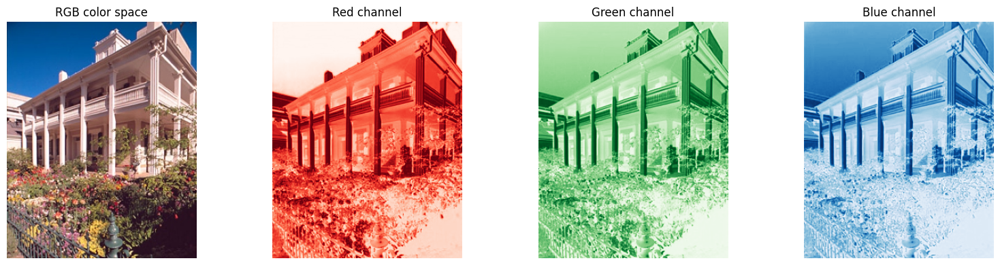

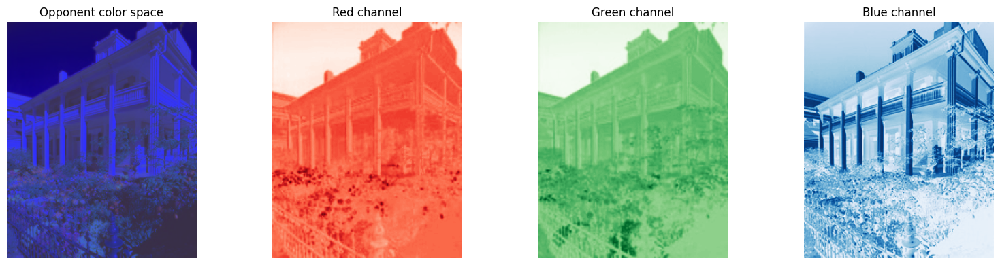

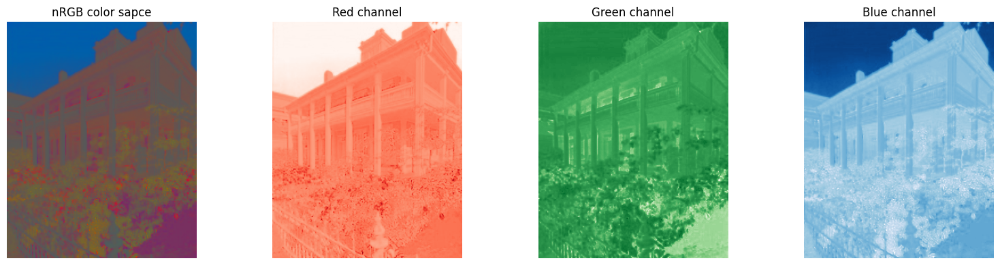

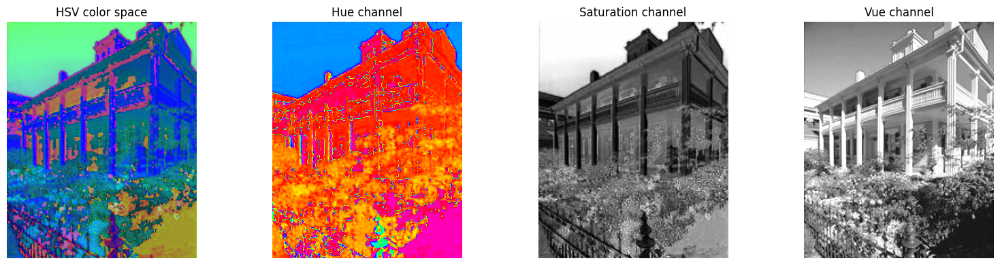

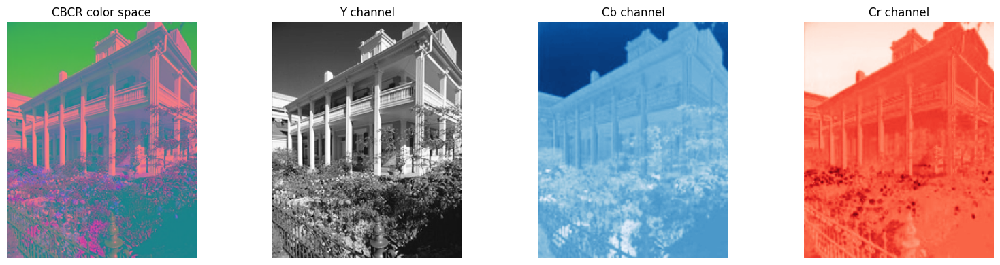

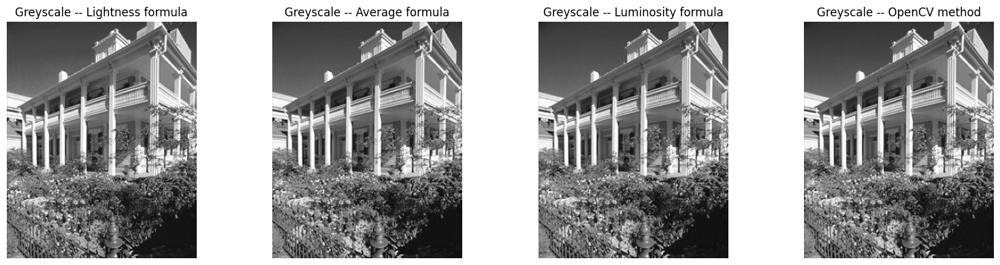

In [10]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

colorspaces = ['rgb', 'opponent', 'nrgb', 'hsv', 'ycbcr', 'grays']

channelsTitles = {
    'rgb': ['RGB color space', 'Red channel', 'Green channel', 'Blue channel'],     # ciascun canale RGB ha la sua colormap
    'opponent': ['Opponent color space', 'Red channel', 'Green channel', 'Blue channel'], # puoi usare lo stesso schema, oppure tutte 'gray'
    'nrgb': ['nRGB color sapce', 'Red channel', 'Green channel', 'Blue channel'],    # normalizzato RGB
    'hsv': ['HSV color space', 'Hue channel', 'Saturation channel', 'Vue channel'],       # H con hsv, S e V in grigio
    'ycbcr': ['CBCR color space', 'Y channel', 'Cb channel', 'Cr channel'],    # Y in grigio, Cb blu, Cr rosso
    'grays' : ["Greyscale -- Lightness formula", "Greyscale -- Average formula", "Greyscale -- Luminosity formula", "Greyscale -- OpenCV method"]
    }

for colorspace in colorspaces:
    visualize_colourspace(image, colorspace, channelsTitles[colorspace])

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>

The Opponent color space is defined by three opponent channels, comprising opposite pair: red-green, blue-yellow, black-white. The colors that define the extremes of each opponent channel are called unique hues. This separation allows color contrasts to stand out even under varying lighting conditions. 
<br>
Source: **An opponent-process theory of color vision**,  LEO M. HURVICH1 AND DOROTHEA JAMESON, 1957

The normalized RGB color space is a space in which there is no intensity information. In this space a color is represent by the proportion of red, green and blue in the color rather than the intensity of each, and their sum must always add up to 1. This makes the color representation more robust to lighting changes, shadows, or highlights thanks to its photometric invariance. Unlike raw RGB, which scales up or down with illumination intensity, normalized RGB is photometrically invariant.

The HSV color space is composed by three components: Hue, Saturation, and Value. The hue is the dominant color, the saturation is the intensity, and the value represent the brightness. HSV decouples colour (hue and saturation) from brightness (value), allowing for more intuitive representation and independent adjustments of these attributes. In addition, this space aligns with human perception and it is highly useful for color-based segmentation and thresholding. Since Hue often remains stable under varying illumination, making it a reliable feature for detecting objects by color.

YCbCr is based on RGB primaries and it is defined by a mathematical coordinate transformation from an associated RGB primaries and a white point. It separates the luminance information (brightness) from the chrominance information (color) using 3 channels: Y the luma component, and CB and CR the blue-difference and red-difference chroma components. This space is widely used in video compression and image processing because human vision is more sensitive to luminance than color detail. Chrominance channels are useful for color-based detection, while luminance captures intensity variations. This separation enables an efficient compression.

The grayscale color space simplifies images by retaining only the luminance information. While it discards color, it is highly useful for texture, edge detection, and shape analysis. By removing color variability, grayscale images reduce computational complexity and highlight structural patterns. The process of converting an RGB image to grayscale involves combining the R, G, and B channels into a single value using methods like the ones above.

In general, using ohter color spaces different than RGB allow to overcome its limitations like: Strongly Correlated Channels, Coupled Luminance and Chrominance, moreover, depending on the analysis we are conducting RGB isn’t always the best. The fact that it mixes brightness and color information makes tasks like segmentation, recognition, and compression more difficult.

Sources: Digital Image Processing, R. C. Gonzalez and R. E. Woods, 4th ed., Pearson, 2018

<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

Another color space is ICtCp, it is used as part of the pipeline in video and digital photography systems for high dynamic range (HDR) and wide color gamut (WCG) imagery. The format is derived from an associated RGB color space by a coordinate transformation that includes two matrix transformations and an intermediate nonlinear transfer function called gamma pre-correction. This transformation produces the value for the three channels I Ct and Cp, the I "intensity" component is a component that represents the brightness of the video, and CT and CP are blue-yellow and red-green chroma components. Compared to other spaces like YCbCr, it provides better perceptual uniformity and less color alterations.

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [11]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """

    gw_img = awb_img.astype(np.float32).copy()

    gw_img[:,:,0] = 128*gw_img[:,:,0] / (np.mean(gw_img[:,:,0]))
    gw_img[:,:,1] = 128*gw_img[:,:,1] / (np.mean(gw_img[:,:,1]))
    gw_img[:,:,2] = 128*gw_img[:,:,2] / (np.mean(gw_img[:,:,2]))

    return normalize(gw_img)

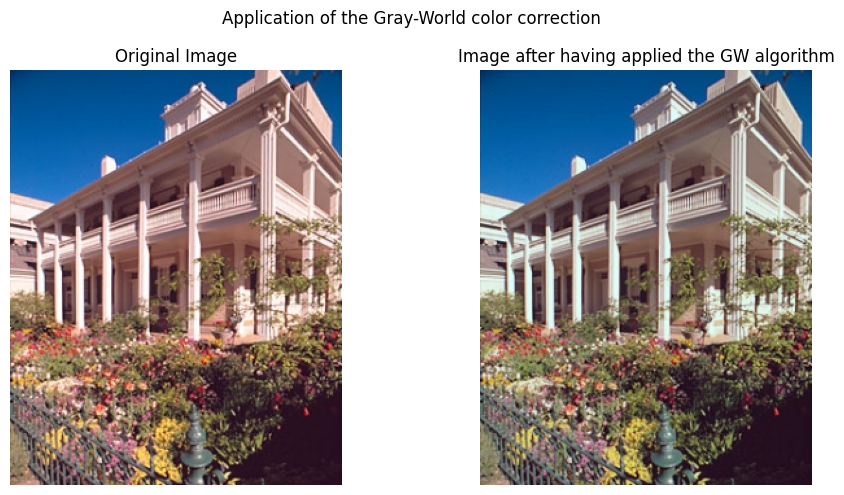

In [12]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gw_img = apply_grey_world_algorithm(image)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

fig.suptitle("Application of the Gray-World color correction")
axes[0].imshow(image)
axes[0].axis('off')
axes[0].set_title("Original Image")
axes[1].imshow(gw_img)
axes[1].axis('off')
axes[1].set_title("Image after having applied the GW algorithm")

plt.tight_layout()
plt.show()

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

The main assumption behind the Grey-World Algorithm is that in a normal balanced photo, the average of the intensities in the 3 channels is a neutral grey. When this assumption does not hold anymore the algorithm cannot correct the light leading to biased or distorted illumination estimates. In particular if the scene is dominated by one color, for example red, the average of the RGB channels will not converge to grey and the algorithm will introduce an artificial color shift (towards blue and green) instead of correcting the light.

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

Another color constancy algorithm is the Edge-Based color constancy, this algorithm aims to estimate the scene illuminant by exploiting edge information instead of relying only on pixel intensity values. The Edge-Based color constancy algorithm is based on the gray-edge hyptothesis, which assumes that the average edge difference in a scene is achromatic. While other methods like the Gray-World algorithm (which operates on pixel intensities) operates on the true image, the Edge-based method is based on the derivative structure of images instead of the original one. In fact, the hypothesis originates from the observation that the color derivative distribution of natural images tends to form a relatively regular, ellipsoid-like shape, where the principal axis aligns with the light source color. The illuminant color **e** is then estimated by using a specific formula for each color channel (R, G, B) and normalizing the vector. The gray-edge assumption is that this resulting vector **e** should be achromatic under the canonical illuminant, so any deviation from gray is attributed to the color of the light source.

Source: **_Edge-Based Color Constancy_**, Joost van de Weijer, Theo Gevers, and Arjan Gijsenij, IEEE TRANSACTIONS ON IMAGE PROCESSING, VOL. 16, NO.9, SEPTEMBER 2007

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

In the side of geometric decomposition, images can be decomposed into distance and orientation.

The distance decomposition provides the range of points visible along the line of sight of the original image. The top of the mountain, for example, is far, and the trees in front are close. A depth map would measure this; the nearby trees would be measured as "close" values, and the back mountain as "far" values.

The orientation decomposition provides a normal vector that shows the surface direction at every point. The mountain faces are oriented in different directions, for example. Some of the rocky slopes face the sun, others slope into shadow. These orientations would be recorded by a normal map: one slope has surface normals pointing east, another slope has normals pointing upwards, and so on.

Images can also be decomposed into specular components and separated into reflections and transparency layers in appearance-based methods.

The specular components are the shiny highlights that come from reflecting light, not the object's color. For example, imagine taking a photo from an orange car; the specular part is the bright white highlight from the reflection of the sun on the car. So, we can remove unwanted lights.

Separating reflections and transparency layers is about handling images that are a mixture of two scenes. The transmitted layer represents the scene behind the transparent surface, while the reflected layer corresponds to the scene in front of the surface that gets reflected onto it. For instance, by taking a photo from a window, the image may include both the scene behind the glass and reflections from objects in front. Decomposition methods can split the image into a transmitted layer, which represents the scene, and a reflected layer, which represents the glass reflection.


<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

This happens because obtaining ground truth for real-world scenes is almost impossible. Separating albedo, shading, or reflections from a real photograph would require controlled lighting and specialized equipment. Synthetic images, on the other hand, provide exact ground truth, scalability, and diverse scenes at low cost, making it the standard choice in the literature.

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [13]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """

    albedo = albedo_img.astype(np.float32) / 255.0
    shading = shading_img.astype(np.float32) / 255.0

    iid_img = albedo * shading
    iid_img = np.clip(iid_img * 255, 0, 255).astype(np.uint8)

    return iid_img

object shape: (270, 480, 3)
object albedo shape: (270, 480, 3)
object shading shape: (270, 480, 3)


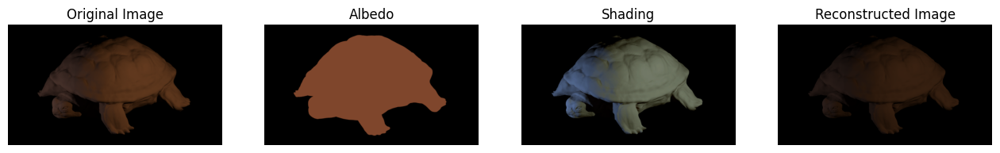

In [14]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'turt_ml1'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object albedo shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object shading shape: {obj_alb.shape}')

reconstructed = reconstruct_image_from_intrinsics(obj_alb, obj_sha)

fig, axes = plt.subplots(1, 4, figsize=(16, 6))
axes[0].imshow(cv2.cvtColor(obj, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[1].imshow(cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB))
axes[1].set_title("Albedo")
axes[2].imshow(cv2.cvtColor(obj_sha, cv2.COLOR_BGR2RGB))
axes[2].set_title("Shading")
axes[3].imshow(cv2.cvtColor(reconstructed, cv2.COLOR_BGR2RGB))
axes[3].set_title("Reconstructed Image")

for ax in axes:
    ax.axis("off")
plt.show()

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [15]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    mask = np.any(albedo_img > 0, axis=-1)
    true_colour = albedo_img[mask].mean(axis=0).astype(np.uint8)

    return true_colour

Estimated true color (RGB): [124  68  43]


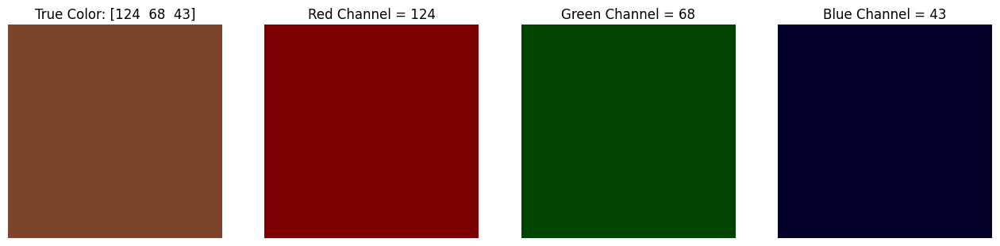

In [16]:
# get the true color of the object's albedo image
obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
true_color = get_true_color(obj_alb_rgb)

print("Estimated true color (RGB):", true_color)

color_patch = np.tile(true_color, (100, 100, 1))

R_patch = np.tile([true_color[0], 0, 0], (100, 100, 1))
G_patch = np.tile([0, true_color[1], 0], (100, 100, 1))
B_patch = np.tile([0, 0, true_color[2]], (100, 100, 1))

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(color_patch)
axes[0].set_title(f"True Color: {true_color}")
axes[0].axis("off")

axes[1].imshow(R_patch)
axes[1].set_title(f"Red Channel = {true_color[0]}")
axes[1].axis("off")

axes[2].imshow(G_patch)
axes[2].set_title(f"Green Channel = {true_color[1]}")
axes[2].axis("off")

axes[3].imshow(B_patch)
axes[3].set_title(f"Blue Channel = {true_color[2]}")
axes[3].axis("off")

plt.show()

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [17]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """
    recolored_albedo = np.zeros_like(albedo_img)

    object_mask = np.any(albedo_img > 0, axis=2)

    red_color = [1.0, 0.0, 0.0]
    recolored_albedo[object_mask] = red_color

    # Ensure shading_img has a channel dimension for broadcasting.
    if shading_img.ndim == 2:
        shading_img = shading_img[..., np.newaxis]

    elif shading_img.ndim == 3 and shading_img.shape[2] == 3:
        shading_img = cv2.cvtColor(shading_img, cv2.COLOR_BGR2GRAY)
        shading_img = shading_img[..., np.newaxis]

    recolored_img = recolored_albedo * shading_img

    return recolored_img

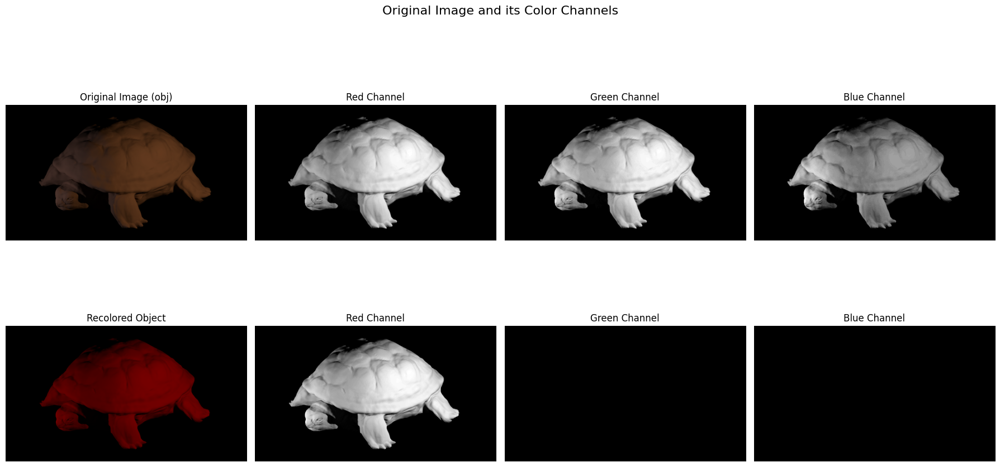

In [18]:
recolored_image = recolor_image(obj_alb, obj_sha)

fig, axes = plt.subplots(2, 4, figsize=(18, 10))
axes = axes.flatten()
fig.suptitle('Original Image and its Color Channels', fontsize=16)

axes[0].imshow(cv2.cvtColor(obj, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image (obj)')
axes[0].axis('off')

red_channel = obj[:, :, 2]
axes[1].imshow(red_channel, cmap='gray')
axes[1].set_title('Red Channel')
axes[1].axis('off')

green_channel = obj[:, :, 1]
axes[2].imshow(green_channel, cmap='gray')
axes[2].set_title('Green Channel')
axes[2].axis('off')

blue_channel = obj[:, :, 0]
axes[3].imshow(blue_channel, cmap='gray')
axes[3].set_title('Blue Channel')
axes[3].axis('off')

axes[4].imshow(recolored_image)
axes[4].set_title('Recolored Object')
axes[4].axis('off')

axes[5].imshow(recolored_image[:, :, 0], cmap='gray')
axes[5].set_title('Red Channel')
axes[5].axis('off')

axes[6].imshow(recolored_image[:, :, 1], cmap='gray')
axes[6].set_title('Green Channel')
axes[6].axis('off')

axes[7].imshow(recolored_image[:, :, 2], cmap='gray')
axes[7].set_title('Blue Channel')
axes[7].axis('off')

plt.tight_layout()
plt.show()

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>

For instance, putting the albedo in red [1,0,0] does not appear pure and uniform because of the definition of intrinsic images. Albedo encodes the intrinsic surface reflectance (the true color of the object, independent of lighting), and shading encodes illumination effects (shadows, highlights, and shape cues from light direction). When reconstructed as a multiplication of these two, they are not uniform, because of bright and dark areas depending on the object’s shape and the lighting in the scene. So, even though albedo is now pure color, the shading modulates its intensity, making some parts darker and others brighter. That’s the reason the recolored object looks shaded and not a uniform color.

In other words, the reconstruction is influenced by both illumination and orientation, which create a variety of intensity values for the red channel. That’s why the recolored object still looks shaded and non-uniform instead of a flat, pure red.

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [19]:
def load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        image = image[:, :, channel]  # extract the specified color channel

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [20]:
def show_results(albedo, normals, height_map=None, SE=None):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
    """
    # stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure(figsize=(5, 5))
        albedo_max = 1  # normalize albedo values
        albedo = albedo / albedo_max
        print("Albedo shape:", albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.title('Albedo Map', fontsize=16)
        plt.show()

    if normals is not None:
        # showing normals as three separate channels
        figure = plt.figure(figsize=(10, 10))
        ax1 = figure.add_subplot(221)
        ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
        ax1.set_axis_off()
        ax1.set_title('Normal Channel x', fontsize=16)
        ax2 = figure.add_subplot(222)
        ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
        ax2.set_axis_off()
        ax2.set_title('Normal Channel y', fontsize=16)
        ax3 = figure.add_subplot(223)
        ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
        ax3.set_axis_off()
        ax3.set_title('Normal Channel z', fontsize=16)
        ax4 = figure.add_subplot(224)
        ax4.imshow((normals + 1) * 0.5)
        ax4.set_axis_off()
        ax4.set_title('Combined Normals', fontsize=16)
        plt.show()

    # Create meshgrid for plotting 3D surfaces
        X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                            np.arange(0, np.shape(normals)[1], stride),
                            np.arange(1))
        X = X[..., 0]
        Y = Y[..., 0]

    # Show both heightmap and SE in a 1x2 subplot if they're available
    if height_map is not None and SE is not None:
        fig = plt.figure(figsize=(8, 4))

        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map")

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE")

        plt.tight_layout()
        plt.show()

    # Only show heightmap if it's available
    elif height_map is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        ax.set_title("Height Map")
        plt.show()

    # Only show SE if it's available
    elif SE is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_SE = SE[::stride, ::stride]
        ax.plot_surface(X, Y, H_SE.T, color='r')
        ax.set_title("SE")
        plt.show()

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [21]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the 
    image stack using the provided light source directions. Optionally, it applies 
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    # Iterate over all pixels
    if shadow_trick:
        for y in range(h):
            for x in range(w):
                i = image_stack[y, x]
                scriptI = np.diag(i)
                
                # Solve the linear system of equations
                g = np.linalg.lstsq(scriptI@scriptV, scriptI @ i, rcond=None)
                g = g[0]
                albedo[y, x] = np.linalg.norm(g)
                if np.linalg.norm(g) != 0:
                    normal[y, x] = g / np.linalg.norm(g)
    else:
        for y in range(h):
            for x in range(w):
                i = image_stack[y, x]
                # Solve the linear system 
                g = np.linalg.lstsq(scriptV, i, rcond=None)
                g = g[0]
                albedo[y, x] = np.linalg.norm(g)
                if np.linalg.norm(g) != 0:
                    normal[y, x] = g / np.linalg.norm(g)
            
    return albedo, normal

image size (h*w): 512*512
Albedo shape: (512, 512)


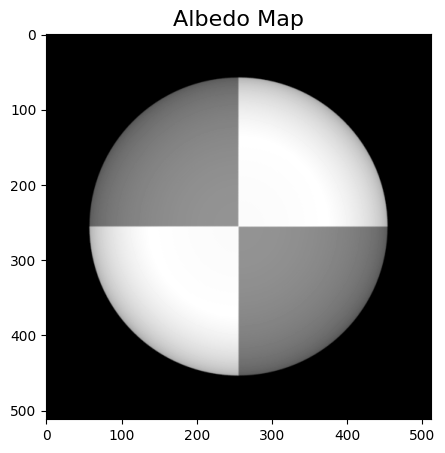

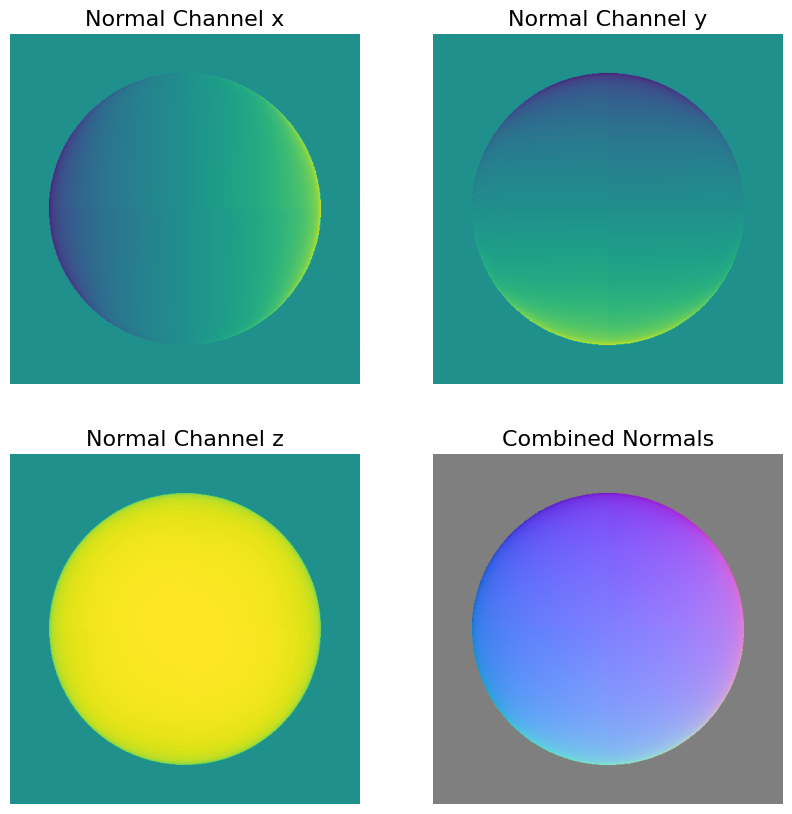

In [22]:
# load synthetic images for SphereGray5
image_stack, normalize_light = load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0)

# estimate albedo and normals
albedo_s5, normals_s5 = estimate_albedo_and_normals(image_stack, normalize_light)

# show results
show_results(albedo_s5, normals_s5)


<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

We would expect the albedo image to give a very clear circle divided into quarters, with each quarter being a solid color without any gradient. In the result from the program, we see that the center of the circle is brighter than the outside of the circle. This error can be explained by the fact that we only have 5 images. More data would mean better results, so because we only have 5 points of data, we will not get a perfect albedo.

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

We will need at least 3 images. This is because, we are solving the following system of linear equations of the following form: $\mathcal I\mathcal V g = \mathcal I i$. Since $\mathcal I\mathcal V$ is a matrix with rows equal to the number of images and 3 columns. If we have less than 3 images, our system of linear equations has more degrees of freedom than constraints, meaning that we will not be able to find a unique solution to the problem.

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

image size (h*w): 512*512
Albedo shape: (512, 512)


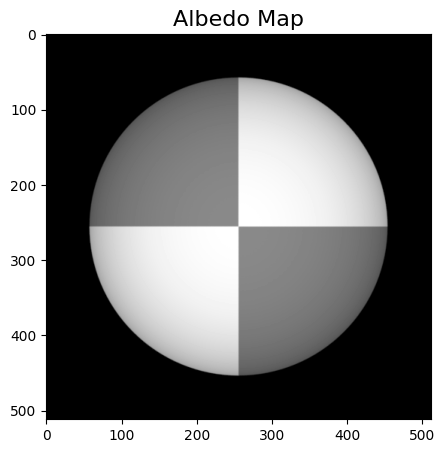

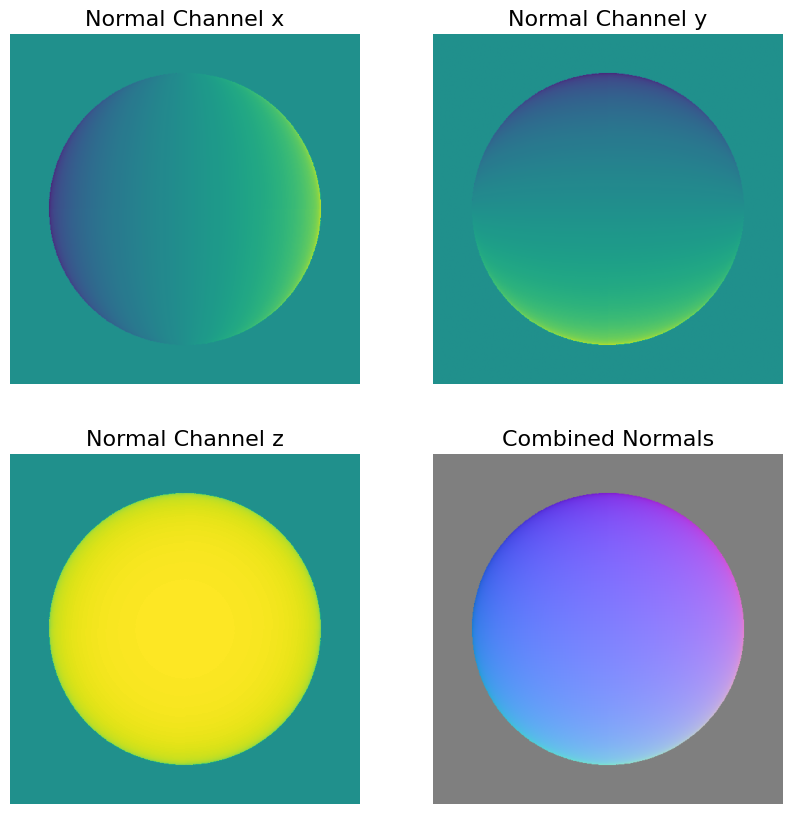

Albedo shape: (512, 512)


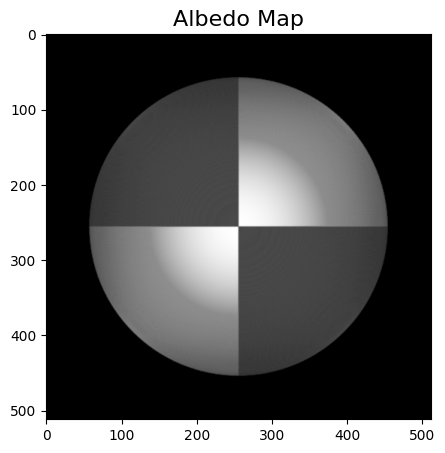

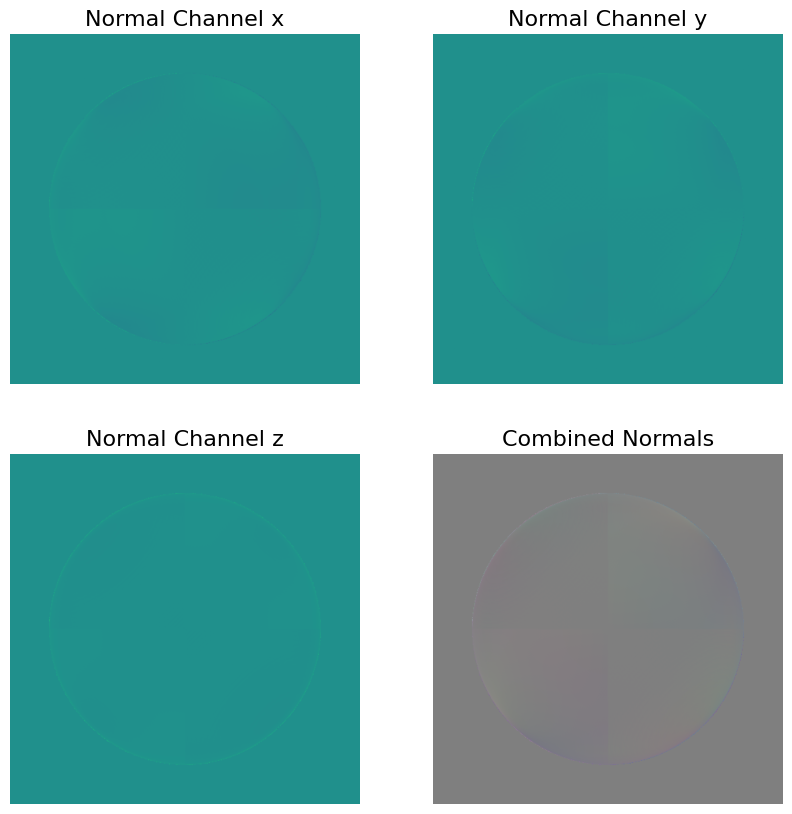

In [23]:
# load synthetic images for SphereGray5
image_stack, normalize_light = load_synthetic_images(image_dir='./photometrics_images/SphereGray25/', channel=0)

# estimate albedo and normals
albedo_s25, normals_s25 = estimate_albedo_and_normals(image_stack, normalize_light)

# show results
show_results(albedo_s25, normals_s25)
show_results(albedo_s25 - albedo_s5, normals_s25 - normals_s5)



##### <font color='yellow'>Answer:</font>

For the naked eye, there is no visible difference between using 5 and using 25 images. If we plot the difference, we can see the following:
- In the case where we use 25 images, the albedo gets a larger value in the center of the sphere. Using 25 photos gives us a larger highlight in the center of the image. This can be explained by seeing that there are more images highlighting the center of the sphere.
- In the plot of the normals, we see that using 25 images gives a better accentuation around the edges of the sphere. This will result in a more smooth representation of the sphere around the edges.

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

image size (h*w): 512*512
image size (h*w): 512*512
Albedo shape: (512, 512)


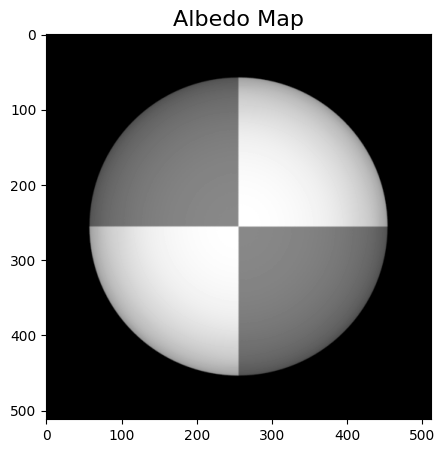

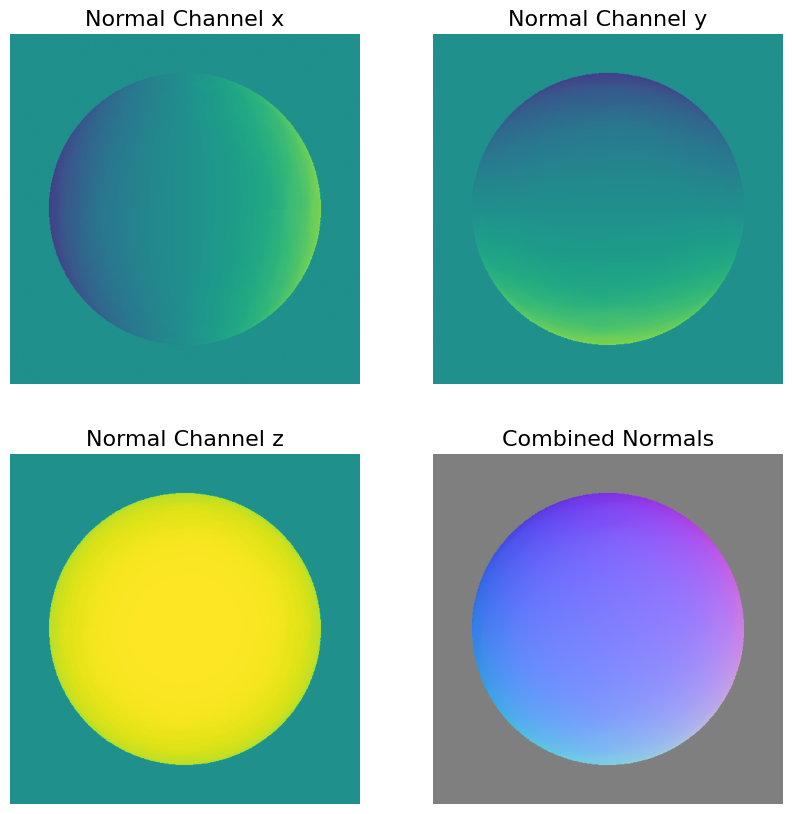

Albedo shape: (512, 512)


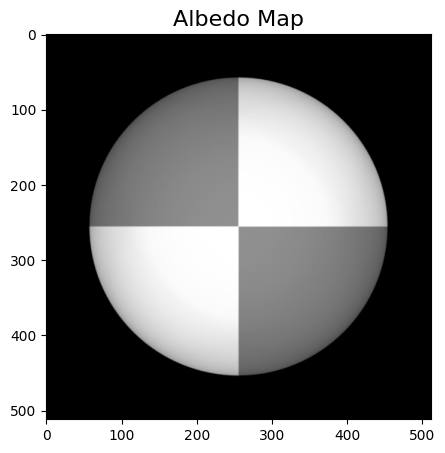

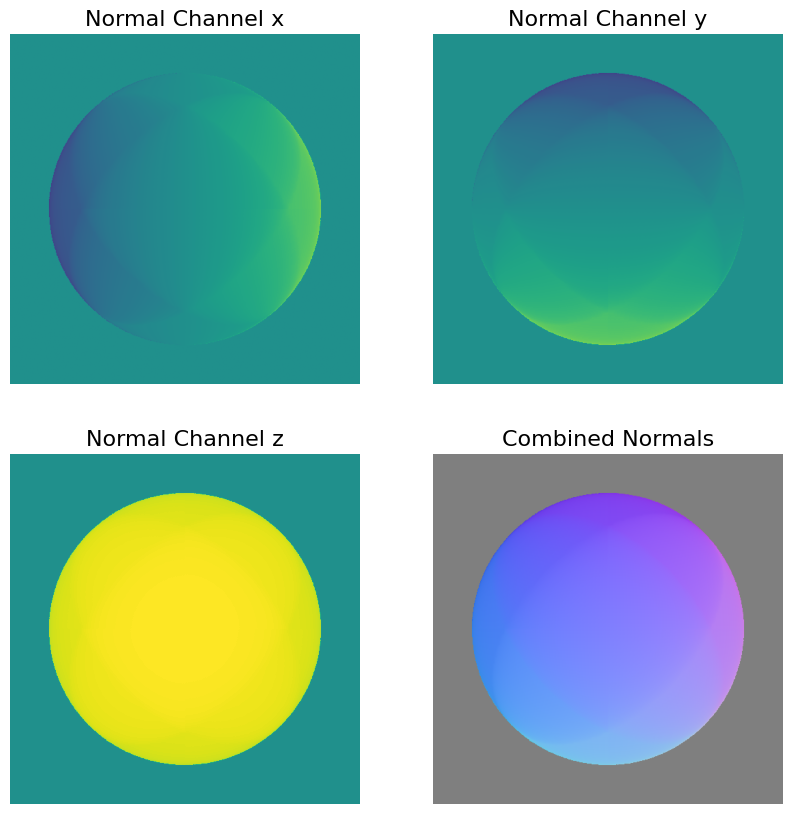

Albedo shape: (512, 512)


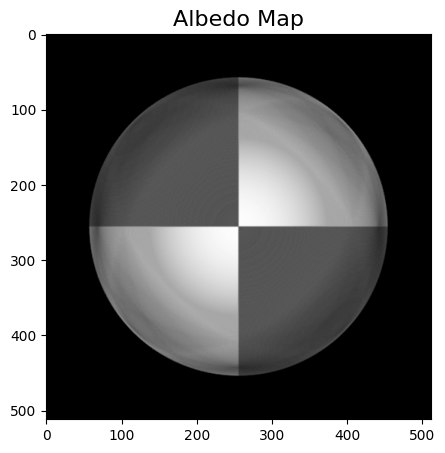

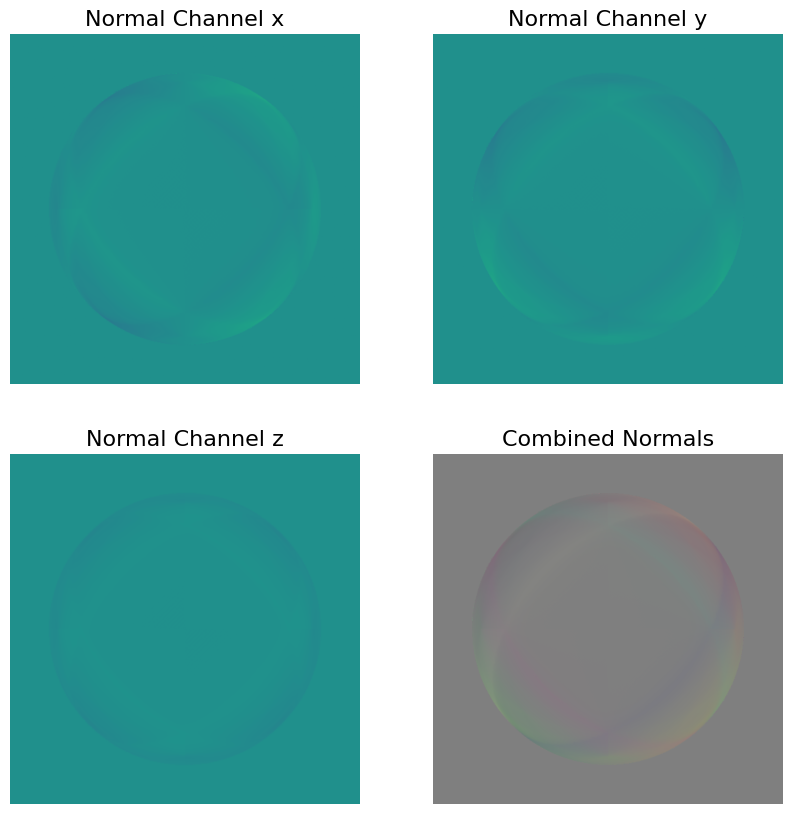

Albedo shape: (512, 512)


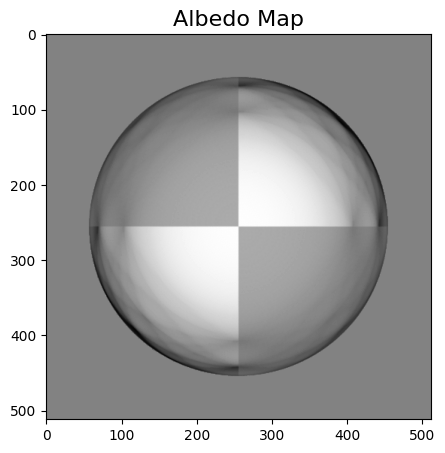

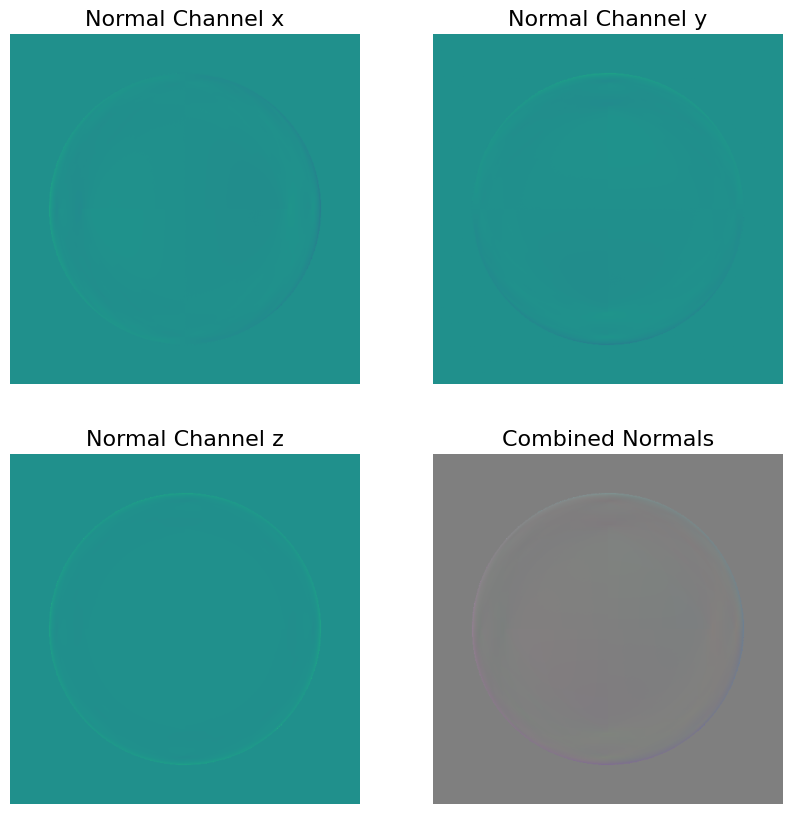

In [24]:
# load synthetic images for SphereGray5 and SphereGray25
image_stack_s25, normalize_light_s25 = load_synthetic_images(image_dir='./photometrics_images/SphereGray25/', channel=0)
image_stack_s5, normalize_light_s5 = load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0)


# estimate albedo and normals
albedo_s25, normals_s25 = estimate_albedo_and_normals(image_stack_s25, normalize_light_s25, shadow_trick=False)
albedo_s5, normals_s5 = estimate_albedo_and_normals(image_stack_s5, normalize_light_s5, shadow_trick=False)
albedo_s25_shadows, normals_s25_shadows = estimate_albedo_and_normals(image_stack_s25, normalize_light_s25, shadow_trick=True)
# show results without shadow trick
# YOUR CODE HERE
show_results(albedo_s25, normals_s25)
show_results(albedo_s5, normals_s5)

show_results(albedo_s25 - albedo_s5, normals_s25 - normals_s5)
show_results(albedo_s25 - albedo_s25_shadows, normals_s25- normals_s25_shadows)

##### <font color='yellow'>Answer:</font>

The shadow trick takes the normal least squares solution and turns it into a weighted least squares solution. This is done by giving a weight to a pixel that is proportionate to the intensity of that pixel in the given image. This will result in a solution that gives 'higher priority' to pixels that are darker i.e. pixels that are unshaded.

When looking at the difference between 25 images with and without the shadow-trick, we can see that using the shadow-trick gives a larger difference in the center of the sphere. The shadow-trick makes it so that the center is darker, meaning that there is a smaller gradient in the sphere.

<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [25]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """

    # initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])
    
    # We make use of the formulas from 2.5.2 from the book: 'Computer Vision A Modern Approach' by Forsyth Ponce
    for y in range(normals.shape[0]):
        for x in range(normals.shape[1]):
            p[y, x]
            # Do not divide by 0
            if normals[y, x, 2] != 0:
                p[y, x] = -normals[y, x, 0] / normals[y, x, 2]
                q[y, x] = -normals[y, x, 1] / normals[y, x, 2]
    
    # Calculate second derivatives using np.gradient
    dp_dy, _ = np.gradient(p)
    _, dq_dx = np.gradient(q)

    # Squared error of mixed partial derivatives
    SE = (dp_dy - dq_dx) ** 2
            
            
    return p, q, SE

In [26]:
# Use the normals that you found in the previous question
p, q, SE = check_integrability(normals_s5)
print('Showing the integrability check results for 5 light sources:')
print(f'SE max: {SE.max()}\n')

p, q, SE = check_integrability(normals_s25)

print('Showing the integrability check results for 25 light sources:')
print(f'SE max: {SE.max()}')

Showing the integrability check results for 5 light sources:
SE max: 0.29038929411821185

Showing the integrability check results for 25 light sources:
SE max: 0.24290399073689245


<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

In [27]:
# estimate albedo and normals
albedo_s25, normals_s25 = estimate_albedo_and_normals(image_stack_s25, normalize_light_s25, shadow_trick=True)
albedo_s5, normals_s5 = estimate_albedo_and_normals(image_stack_s5, normalize_light_s5, shadow_trick=True)

# Use the normals that you found in the previous question
p, q, SE = check_integrability(normals_s5)
print('Showing the integrability check results for 5 light sources:')
print(f'SE max: {SE.max()}\n')

p, q, SE = check_integrability(normals_s25)

print('Showing the integrability check results for 25 light sources:')
print(f'SE max: {SE.max()}')

Showing the integrability check results for 5 light sources:
SE max: 1.1575454400510214

Showing the integrability check results for 25 light sources:
SE max: 0.867245488903459


##### <font color='yellow'>Answer:</font>

The errors here can be explained by the border of the sphere. At the border, the algorithm thinks that there is a flat 'sheet', that originated from the background. At this point, the calculated surface function is not differentiable, so the second derivatives are not equal. This will result in larger squared errors at the border. 

We can also see that the integrability check gives a smaller error when using more images. This is because using more images will be able to generate a smoother surface, which will make the squared errors smaller, because the surface function is closer to a smooth function.

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [28]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type == 'column':
        # We iterate smartly, so that we don't recalculate the same results
        for y in range(h):
            for x in range(w):
                if y == 0 and x == 0:
                    height_map[y, x] = p[0, 0] + q[0, 0]
                elif y != 0 and x == 0:
                    height_map[y, x] = height_map[y - 1, x] + q[y, x]
                elif x != 0:
                    height_map[y, x] = height_map[y, x - 1] + p[y, x]
        # Force the top left corner to get height 0
        c =  - p[0, 0] + q[0, 0]
        for y in range(h):
            for x in range(w):
                height_map[y, x] += c


    elif path_type == 'row':
        for x in range(w):
            for y in range(h):
                if y == 0 and x == 0:
                    height_map[y, x] = p[0, 0] + q[0, 0]
                elif y == 0 and x != 0:
                    height_map[y, x] = height_map[y, x - 1] + p[y, x]
                elif y != 0:
                    height_map[y, x] = height_map[y - 1, x] + q[y, x]
        # Force the top left corner to get height 0
        c =  - p[0, 0] + q[0, 0]
        for y in range(h):
            for x in range(w):
                height_map[y, x] += c


    elif path_type == 'average':
        column_height_map = construct_surface(p, q, path_type='column')
        row_height_map = construct_surface(p, q, path_type='row')
        height_map = (column_height_map + row_height_map) / 2
        

    return height_map

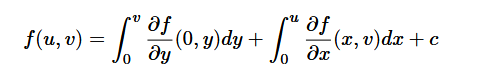

[-4.91021306e-17  0.00000000e+00  1.00000000e+00]
Showing the surface reconstruction results for 5 light sources using column-major integration:


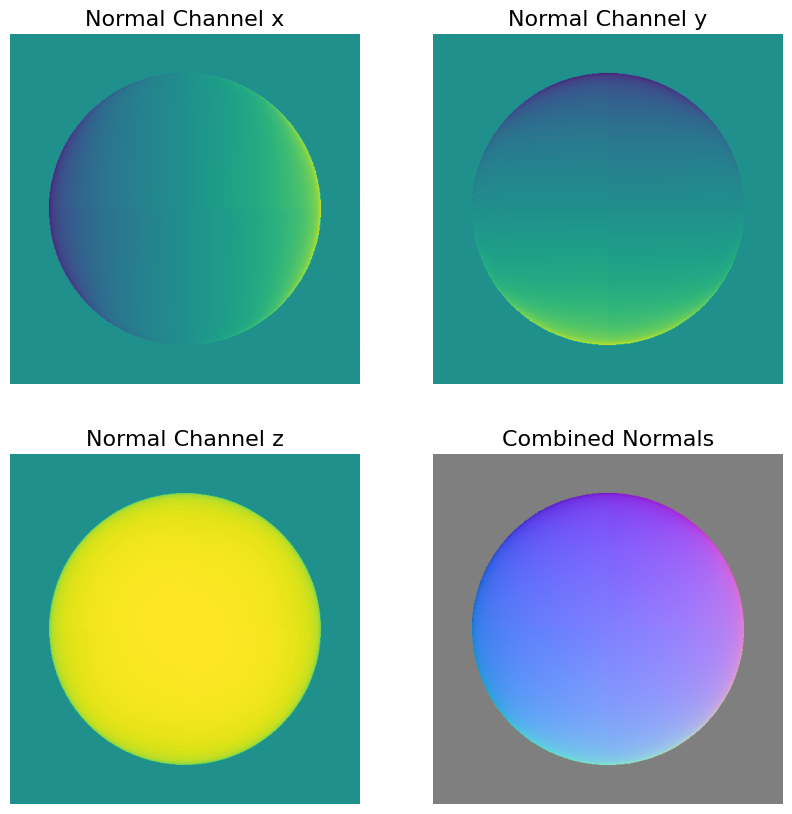

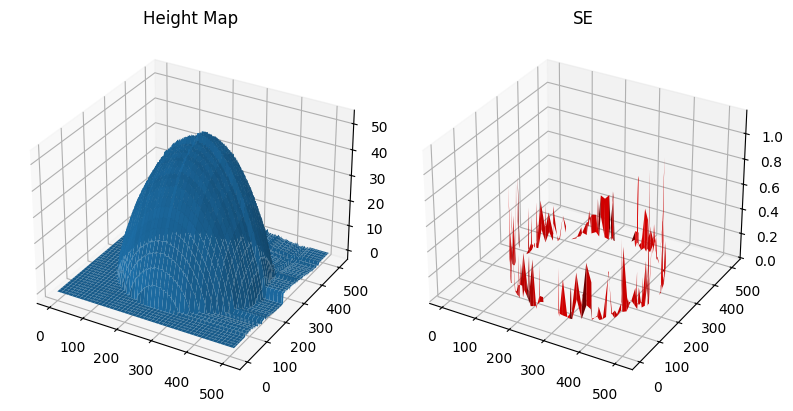

In [29]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "average")

h, w = p.shape

print(normals_s5[h // 2][w // 2])
# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Showing the surface reconstruction results for 5 light sources using column-major integration:')
show_results(None, normals_s5, height_map, SE)

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

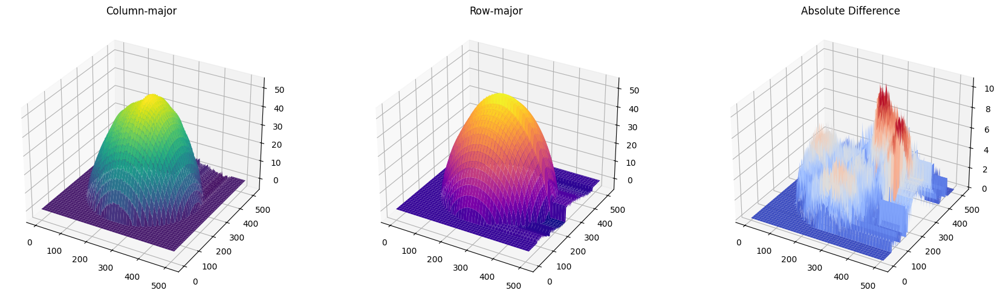

In [30]:
height_map_col = construct_surface(p, q, "column")
height_map_row = construct_surface(p, q, "row")
height_map_diff = abs(height_map_col - height_map_row)

fig = plt.figure(figsize=(18, 5))

# Column-major with 'viridis'
ax1 = fig.add_subplot(1, 3, 1, projection='3d')
ax1.plot_surface(*np.meshgrid(np.arange(height_map_col.shape[0]), np.arange(height_map_col.shape[1])), height_map_col.T, cmap='viridis')
ax1.set_title('Column-major')

# Row-major with 'plasma'
ax2 = fig.add_subplot(1, 3, 2, projection='3d')
ax2.plot_surface(*np.meshgrid(np.arange(height_map_row.shape[0]), np.arange(height_map_row.shape[1])), height_map_row.T, cmap='plasma')
ax2.set_title('Row-major')

# Difference with 'coolwarm'
ax3 = fig.add_subplot(1, 3, 3, projection='3d')
ax3.plot_surface(*np.meshgrid(np.arange(height_map_diff.shape[0]), np.arange(height_map_diff.shape[1])), height_map_diff.T, cmap='coolwarm')
ax3.set_title('Absolute Difference')

plt.tight_layout()
plt.show()

##### <font color='yellow'>Answer:</font>

Observing the two height maps we can denote that:
- The column-major map shows a significant discontinuity vertically around the center of the image
- The row-major map shows a significant discontinuity horizontally around the center of the image

These difference between the two approaches can be seen more evidently in the third graph, with its two peaks corresponding to these discontinuities. To fully comprehend where these discontinuities derive from, we have to remember the fact that our sphere is divided into four quadrants, with the top-left and bottom-right ones darker than the remaining two.

With the first approach we start integrating on the left-most column, proceding on a row-per-row process. In this path, we will encounter the vertical change of the quadrants of the sphere, from light to dark or vice-versa. This radical change will create a discontinuity in the partial derivative respective to y, meaning that we are going to observe a 'jump' in the height map. This is what we observe in the first image.

With the second approach we start integrating on the top-most row, proceding on a column-per-column process. In this path, we will encounter the horizontal change of the quadrants of the sphere, from light to dark or vice-versa. This radical change will create a discontinuity in the partial derivative respective to x, meaning that we are going to observe a 'jump' in the height map. This is what we observe in the second image.

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (2 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

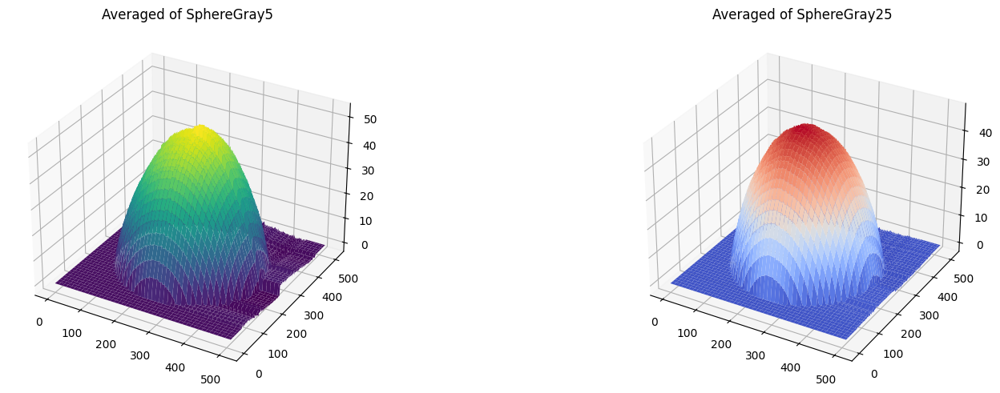

In [31]:
height_map_avg = construct_surface(p, q, "average")
p1, q1, SE2 = check_integrability(normals_s25)
height_map_avg1 = construct_surface(p1, q1, "average")

fig = plt.figure(figsize=(18, 5))

#SphereGray5
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(*np.meshgrid(np.arange(height_map_col.shape[0]), np.arange(height_map_col.shape[1])), height_map_avg.T, cmap='viridis')
ax1.set_title('Averaged of SphereGray5')

#SphereGray25
ax3 = fig.add_subplot(1, 2, 2, projection='3d')
ax3.plot_surface(*np.meshgrid(np.arange(height_map_diff.shape[0]), np.arange(height_map_diff.shape[1])), height_map_avg1.T, cmap='coolwarm')
ax3.set_title('Averaged of SphereGray25')

plt.tight_layout()
plt.show()

##### <font color='yellow'>Answer:</font>

In both cases the height map discontinuities are smoother if compared to those seen in the single-path approach. This is a pretty intuitive outcome, since by averaging discontinuous zones in one map with continuous zones in the other one we effectively obtain a more continuous height map.

Comparing the results obtained from `SphereGray5`and `SphereGray25`, we can denote a significant difference in correspondence of the discontinuities, which appear much less abrupt in the height map generated from the latter dataset. This is related to the larger amount of data available, which inevitably makes our approximations of the derivatives closer to the actual values.

The results are still not very far from each other, indicating that even with a smaller dataset we can still obtain a good enough height map by integrating the partial derivatives over multiple paths.

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [32]:
def photometric_stereo(image_dir='./photometrics_images/MonkeyGray/',  num_images=None):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').
        num_images: If set, only the first num_images will be used.

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape

    if num_images is not None and num_images < n:
            image_stack = image_stack[:, :, :num_images]
            scriptV = scriptV[:num_images, :]
    
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    albedo_monkey, normal_monkey = estimate_albedo_and_normals(image_stack, scriptV)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p_m, q_m, SE = check_integrability(normal_monkey)

    threshold = 0.01


    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    height_map_monkey = construct_surface(p_m, q_m, "average")

    # show results
    print('Displaying results...\n')

    show_results(albedo_monkey, normal_monkey, height_map_monkey, SE)

If you estimate the albedo and surface normal for MonkeyGrat, the cell below will run for at least 20 seconds.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3248

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


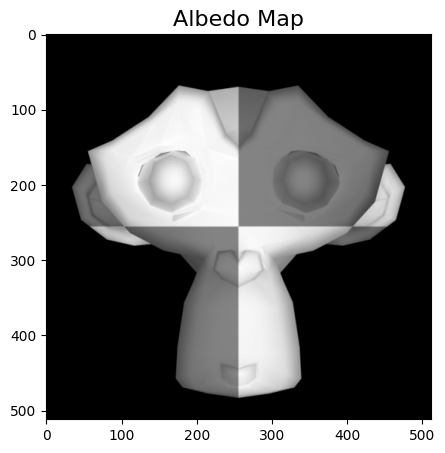

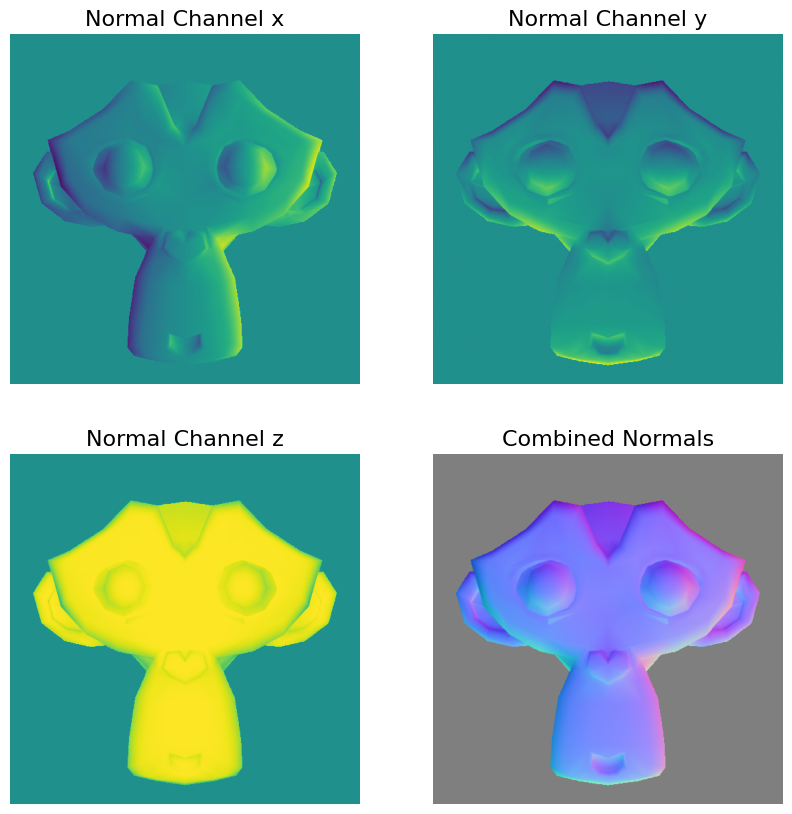

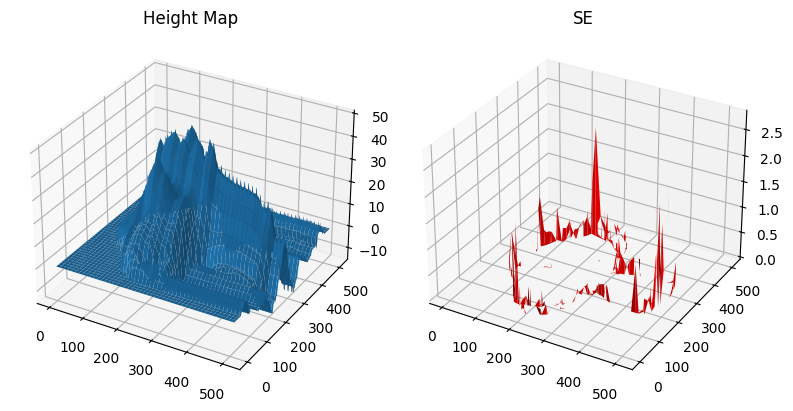

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3708

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


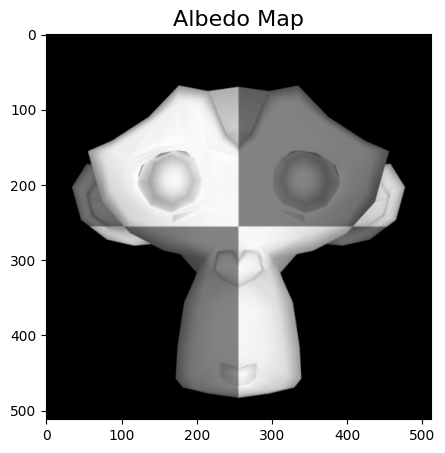

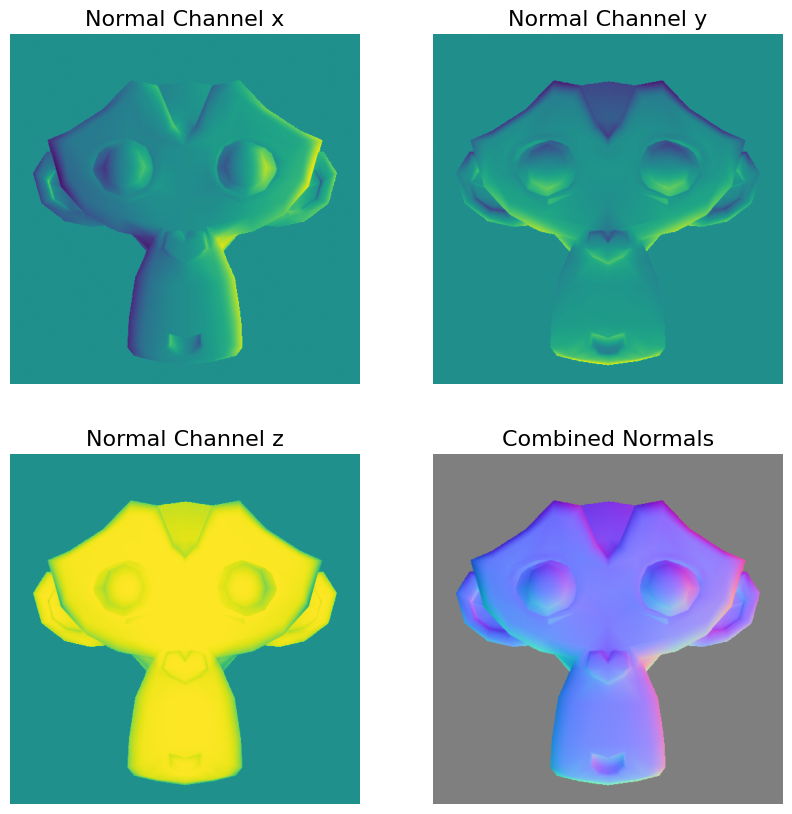

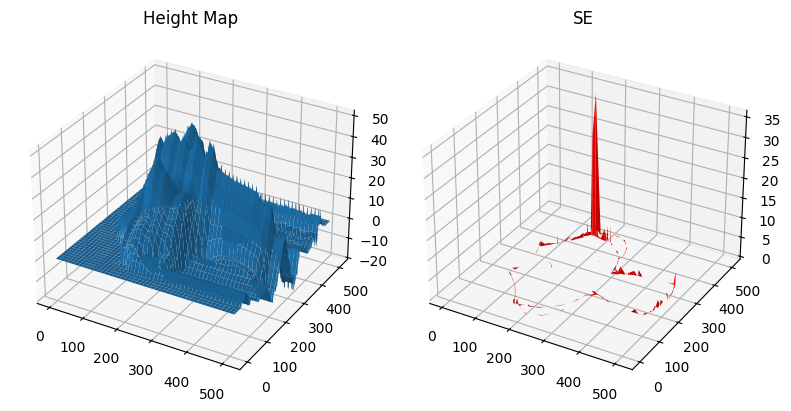

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 4991

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


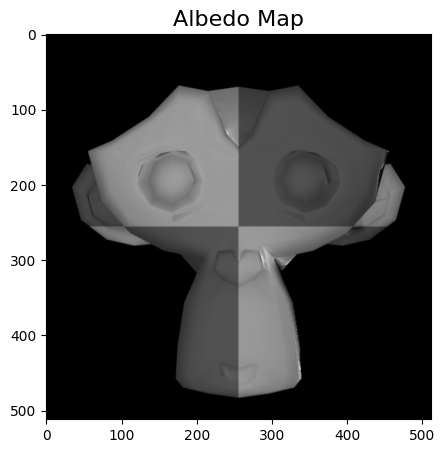

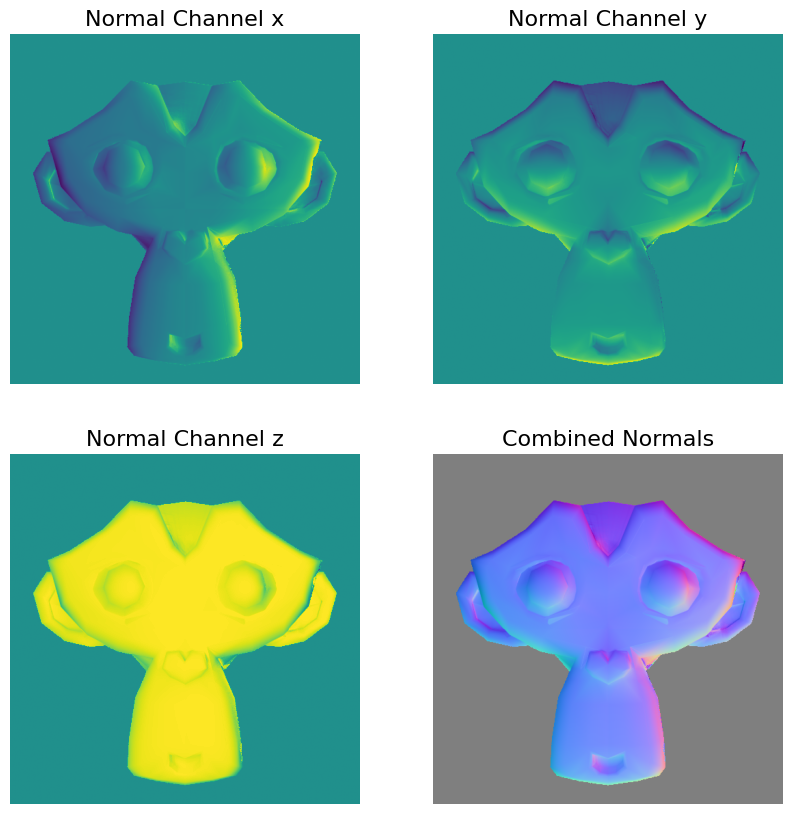

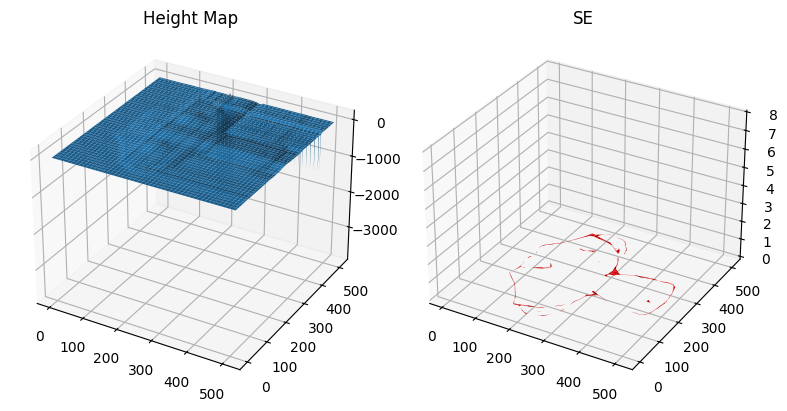

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 6491

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


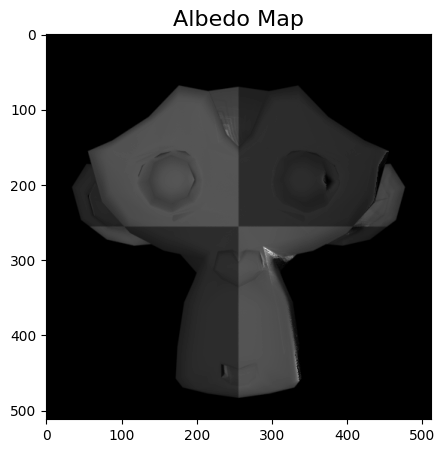

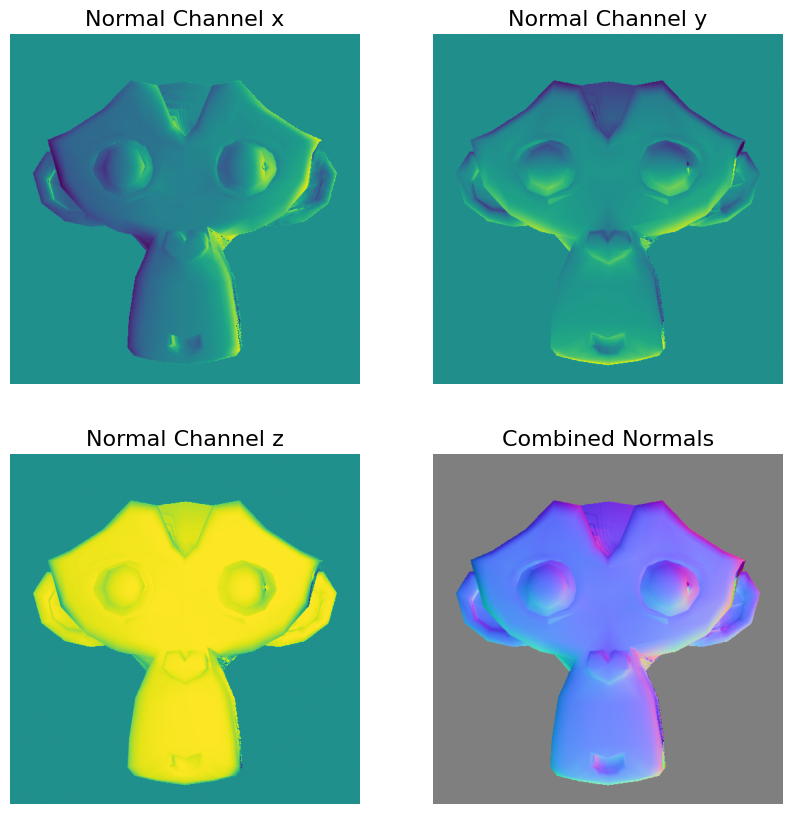

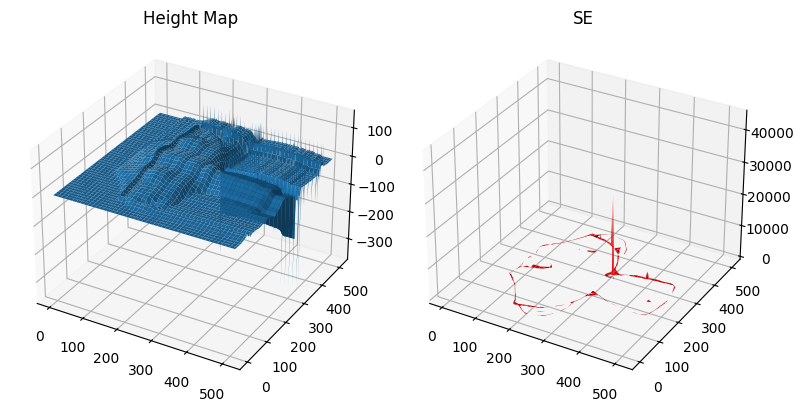

In [33]:
# Use the function
image_dir = './photometrics_images/MonkeyGray/'

photometric_stereo(image_dir)

photometric_stereo(image_dir, 100)

photometric_stereo(image_dir, 60)

photometric_stereo(image_dir, 30)

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors (SE) compared to the sphere. Observe and describe the errors (SE) that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

The errors we observe in this model are overall bigger and more widspread compared to the sphere datasets. The highest peaks correspond to the borders of the monkey, like the ears or the space between the eyes. These errors indicate that the estimated surface normals in those areas deviate from those of a real surface, probably because of non-integrability in these sections.

The reasons for these errors are quite a few, but all of them derive from Monkey's complex 3D geometry. Unlike the sphere, which apart from being divided in dark and bright quadrants didn't present other forms of disturbance, the `MonkeyGray` dataset presents a model full of shadows, with concave parts and sharp edges. All of these will effect the shading, creating errors in the partial derivatives

When experimenting with different numbers of images (e.g., 30, 60, 100, all), it is clear that increasing the dimension of the dataset generally reduces the errors and produces smoother, more reliable results. However, these errors still remain much bigger than those obtained from the `SphereGray5` or the `SphereGray25` datasets.

This latter analysis demonstrates that while more images surely help, the main sources of error are the complexity of the object observed and the deviations from ideal assumptions (Lambertian surface with no shadows).

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>

From our experiments, it is intuitive to notice how increasing the number of photometric images surely helps in reducing the errors. Another possible approach would be moving the camera instead of the lights and capturing images from different angles. This could surely help reducing the innacuracies (although an additional algorithm to integrate this new data would be needed).

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [34]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """

    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack_rgb = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order

        # initialize image stack and light direction array on the first iteration
        if image_stack_rgb is None:
            height, width, _ = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack_rgb = np.zeros([height, width, 3, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the fourth dimension for RGB
        for j, channel in enumerate([0, 1, 2]):
            image_stack_rgb[:, :, j, i] = image[:, :, channel]

        # extract light directions
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack_rgb = np.double(image_stack_rgb)

    # normalize the image stack
    min_val = np.min(image_stack_rgb)
    max_val = np.max(image_stack_rgb)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack_rgb = (image_stack_rgb - min_val) / (max_val - min_val)
    else:
        image_stack_rgb = np.zeros(image_stack_rgb.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    scriptV_rgb = light_directions / norm_factors
    
    return image_stack_rgb, scriptV_rgb

In [35]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.
    
    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """
    # Calculate normals for each channel
    albedo_red, normals_red = estimate_albedo_and_normals(image_stack[:, :, 0, :], scriptV)
    albedo_green, normals_green = estimate_albedo_and_normals(image_stack[:, :, 1, :], scriptV)
    albedo_blue, normals_blue = estimate_albedo_and_normals(image_stack[:, :, 2, :], scriptV)

    # Combine albedos into RGB
    albedo = np.dstack((albedo_red, albedo_green, albedo_blue))
    
    # Average the normals and ensure they're normalized
    normals_sum = normals_red + normals_green + normals_blue
    norms = np.linalg.norm(normals_sum, axis=2, keepdims=True)
    
    # Avoid division by zero
    norms[norms == 0] = 1
    normals = normals_sum / norms

    return albedo, normals

In [36]:
def photometric_stereo_rgb(image_dir='./SphereColor/'):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """

    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images_rgb(image_dir)
    [h, w, c, n] = image_stack.shape

    print('Finish loading %d images.\n' % n)

    print('Computing surface albedo and normal map...\n')

    albedo, normal = estimate_albedo_and_normals_rgb(image_stack, scriptV)

    print('Integrability checking\n')

    p, q, SE = check_integrability(normal)

    threshold = 0.01

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, "average")

    print('Displaying results...\n')

    show_results(albedo, normal, height_map, SE)

If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3259

Computing surface height map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3706152735561643].


Displaying results...

Albedo shape: (512, 512, 3)


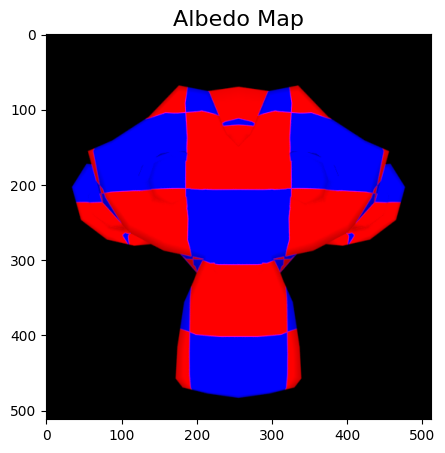

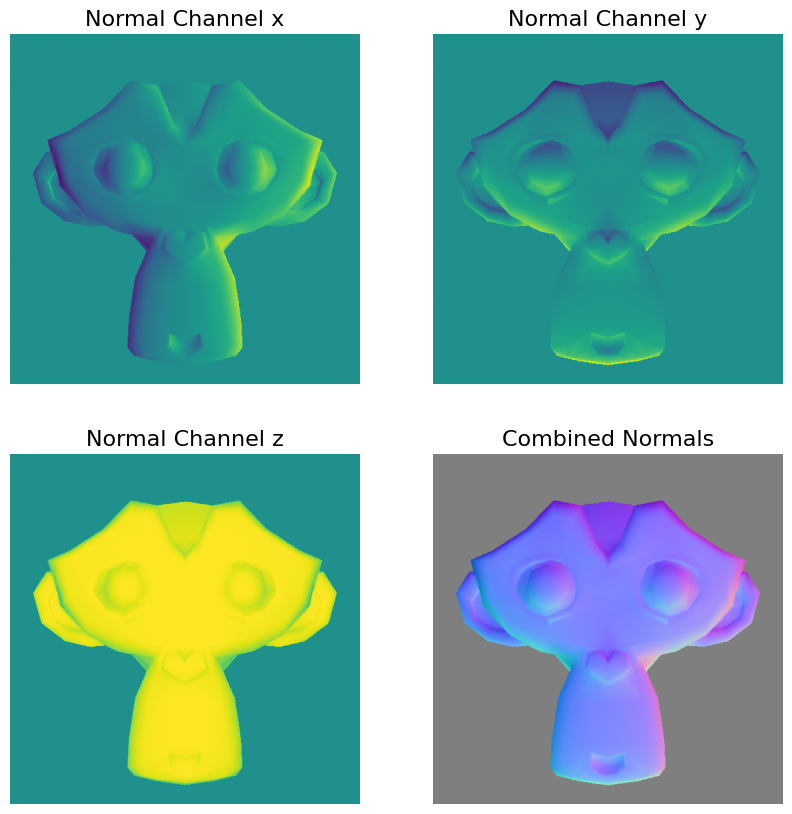

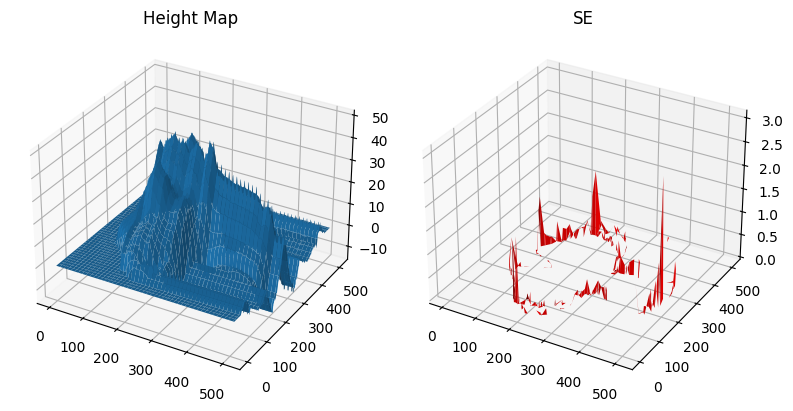

Loading images...

image size (h*w): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 1559

Computing surface height map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3330540801140758].


Displaying results...

Albedo shape: (512, 512, 3)


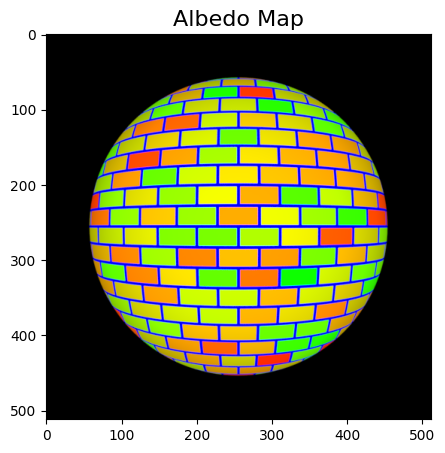

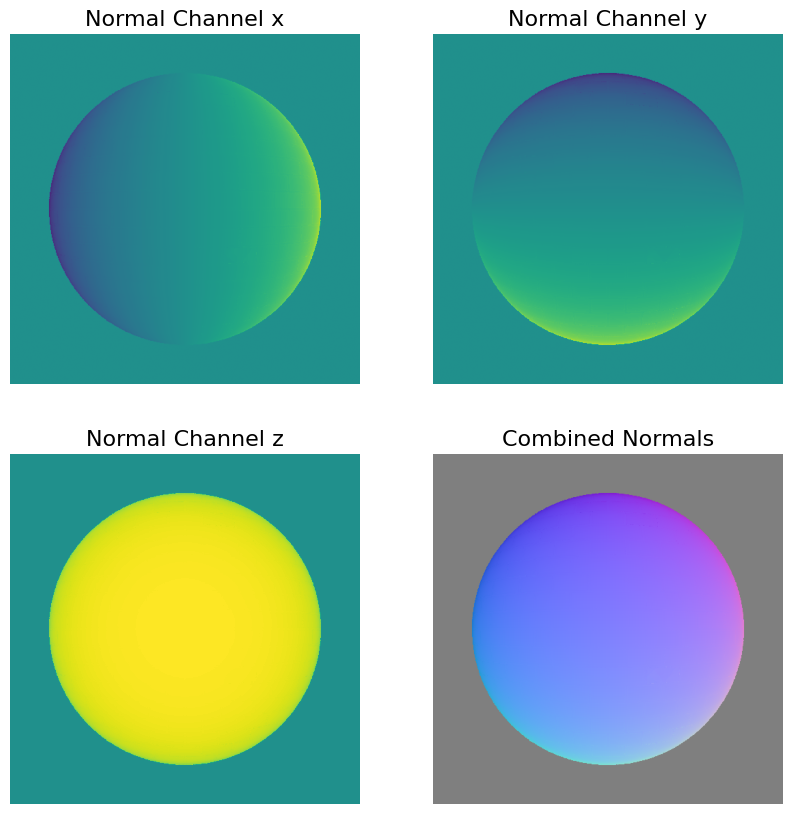

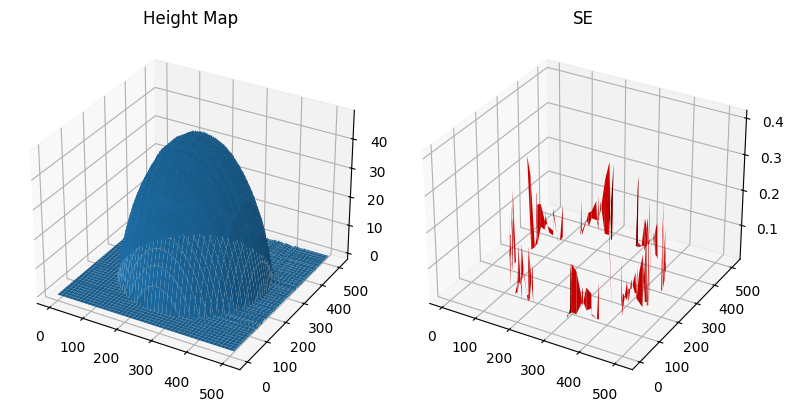

In [37]:
image_dir1 = './photometrics_images/MonkeyColor/'

image_dir2 = './photometrics_images/SphereColor/'

photometric_stereo_rgb(image_dir1)

photometric_stereo_rgb(image_dir2)

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

In order to computer the Photometric Stereo on an RGB image, we computed the albedo and the normal surface of each channel separately. We then stacked the albedos in a single three-dimensional array to make it a colored image, and normalized the sum of the normals for the three channels.

By following this process we ensure that:
- The resulting albedo map shows proper color reproduction, preserving the color transitions from the original images
- The surface geometry is more accurately captured, even though some areas with strong color variations may show some normal estimation errors

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

In the photometric stereo technique the height map is constructed from the intensity values registered across the different images captured. A pixel with a value of 0 in any color channel implies that the reflectance in that point is zero, meaning that the normal for that pixel will be undefined. This event creates errors in the normal map, corresponding to discontinuities in the partial derivatives, making that pixel non-integrable.

A way to overcome this issue could be represented by interpolating the value of the pixel whenever the original one is equal to zero. The optimal choice is to use the values of the neighbours to generate the new value, for example by using the median filter discussed at lecture.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [48]:
def load_face_images(image_dir='./photometrics_images/yaleB02/'):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    h, w = ambient_image.shape
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    d = random.sample(d, num_images)
    
    filenames = [os.path.basename(x) for x in d]

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)

    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    

    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same


    return image_stack, scriptV

In [49]:
def photometric_stereo_face_dataset(image_dir='./images/photometrics_images/yaleB02/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.003

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type)

    # show results
    print(f'Displaying results with the {path_type} approach\n')

    show_results(albedo, normals, height_map, SE)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2776

Computing surface height map...

Displaying results with the row approach

Albedo shape: (192, 168)


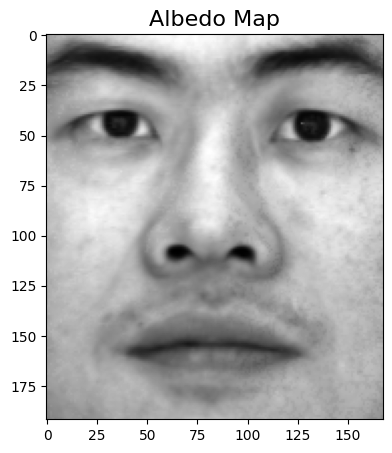

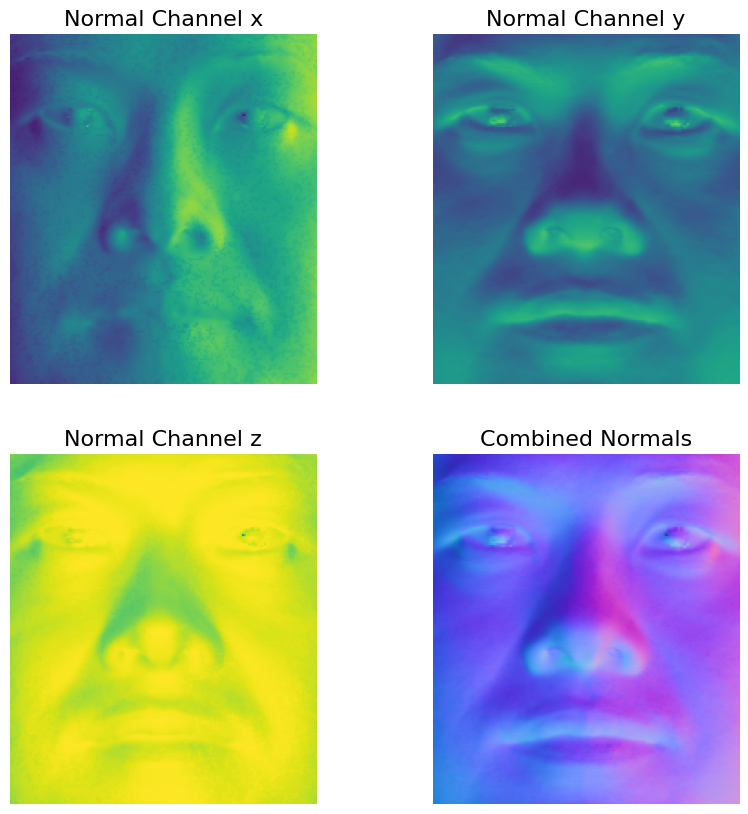

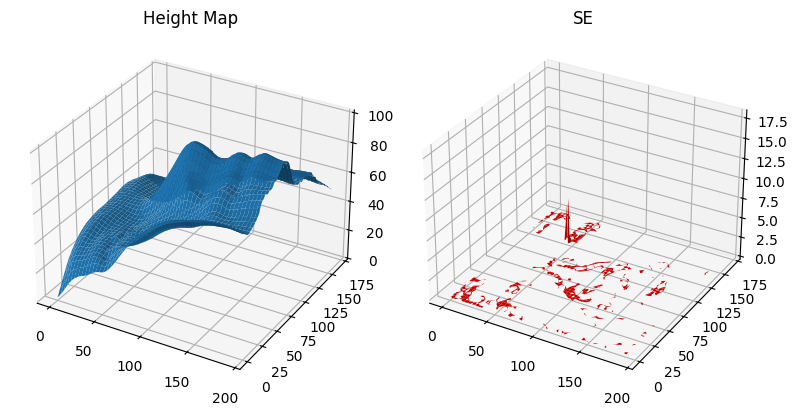

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2776

Computing surface height map...

Displaying results with the column approach

Albedo shape: (192, 168)


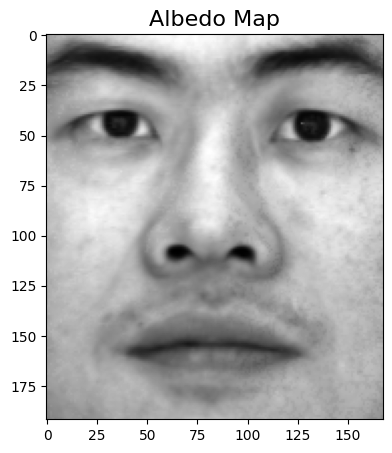

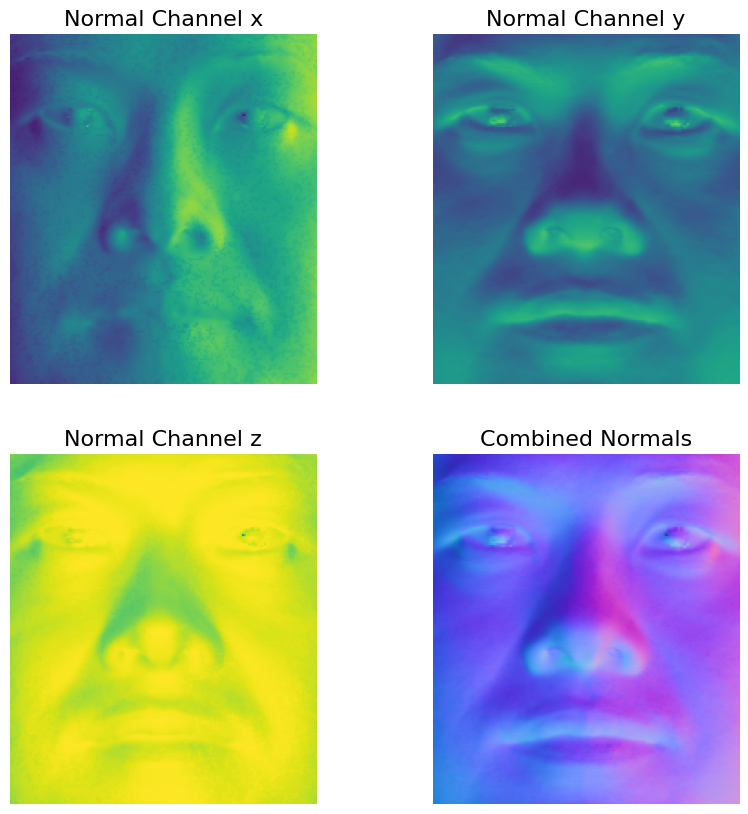

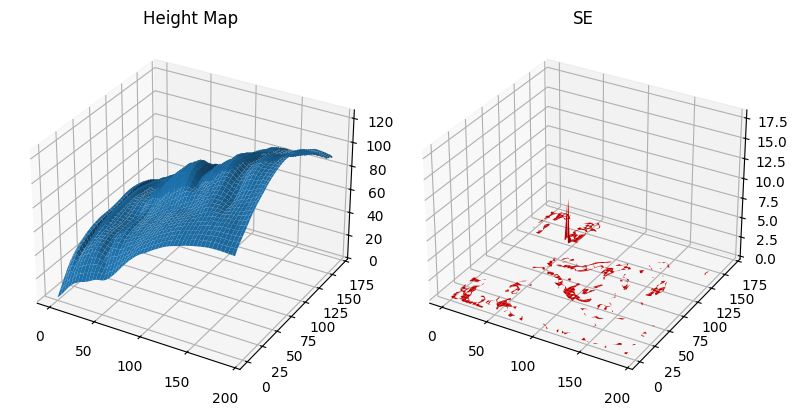

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2776

Computing surface height map...

Displaying results with the average approach

Albedo shape: (192, 168)


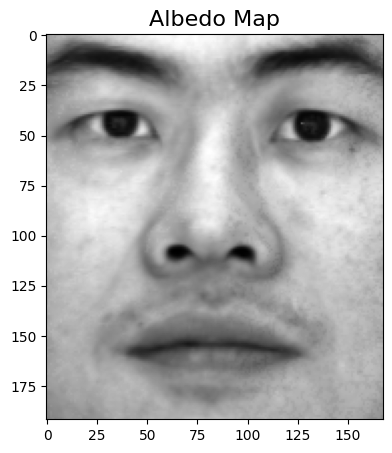

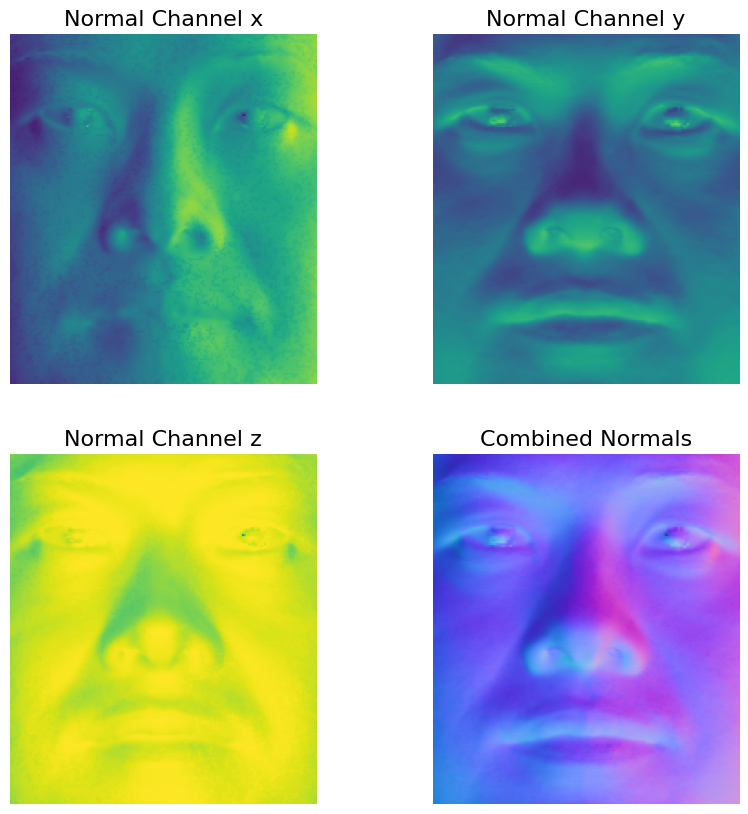

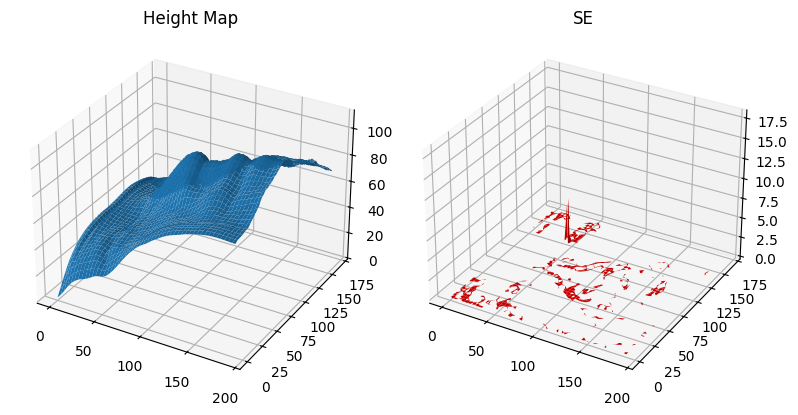

In [50]:
#Height map using row-major integration
photometric_stereo_face_dataset(image_dir='./photometrics_images/yaleB02/', path_type='row')
#Height map using column-major integration
photometric_stereo_face_dataset(image_dir='./photometrics_images/yaleB02/', path_type='column')
#Height map using average of the two approaches
photometric_stereo_face_dataset(image_dir='./photometrics_images/yaleB02/', path_type='average')

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

It is easy to see that the row-major method return a more diverse height map if compared to the column-major one, which instead appears very flat and smooth. These significant differences between the approaches are (once again) due to the complex geometry of the face. If we were to trace horizontal and vertical lines across the face, we would notice that horizontal lines encounter more abrupt changes, such as the nose and the lips, while vertical lines tend to follow smoother transitions, like the cheeks. As a result, the partial derivatives with respect to x capture significant variations in the surface height, while the derivatives along y are much more linear, resulting in the height map being less diverse overall.

The average method gives us a more realistic representation of the face in the height map, since it compensates for the errors in the partial derivatives by averaging them. So, also with this dataset, we see how averaging the two approaches is a very functioning method to get rid of the discontinuities in the partial derivatives.

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

All of the images in the question33_ex list either contain shiny reflections, which violate the assumption that the surface should be Lambertian, or are completely dark.

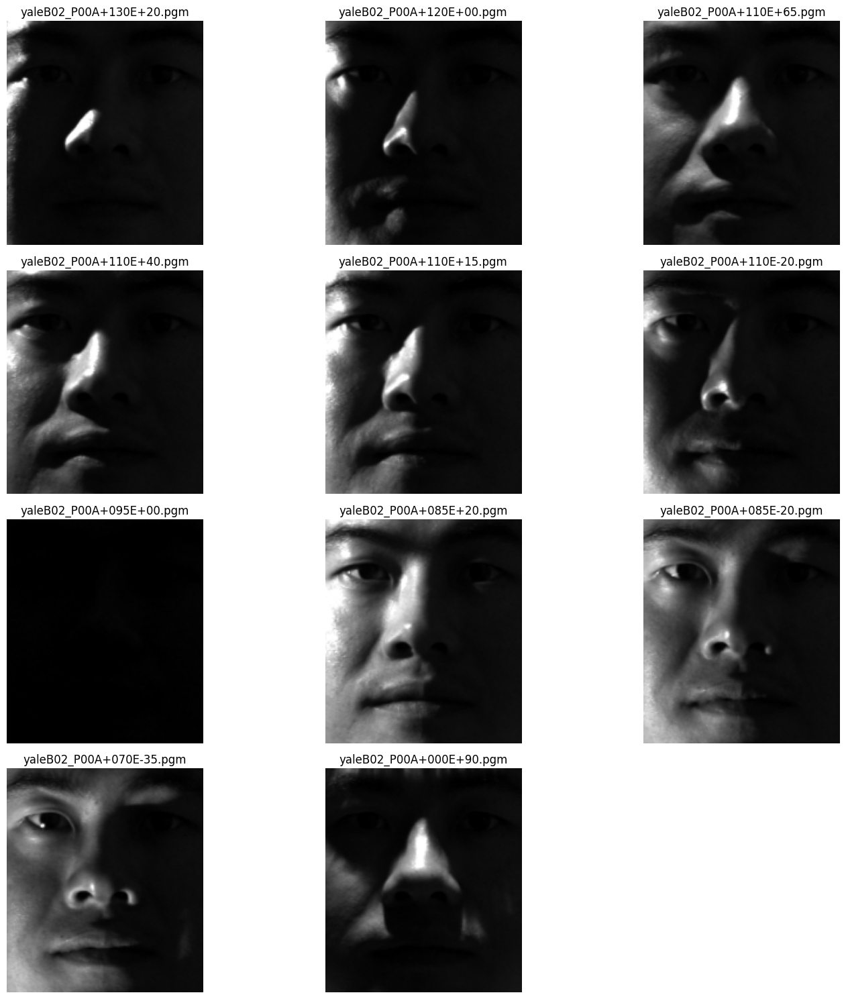

In [41]:

path_prefix = 'photometrics_images/yaleB02/'

question33_ex = ['yaleB02_P00A+130E+20.pgm',
              'yaleB02_P00A+120E+00.pgm',
              'yaleB02_P00A+110E+65.pgm',
              'yaleB02_P00A+110E+40.pgm',
              'yaleB02_P00A+110E+15.pgm', 
              'yaleB02_P00A+110E-20.pgm',
              'yaleB02_P00A+095E+00.pgm',
              'yaleB02_P00A+085E+20.pgm',
              'yaleB02_P00A+085E-20.pgm',
              'yaleB02_P00A+070E-35.pgm',
              'yaleB02_P00A+000E+90.pgm']


plt.figure(figsize=(15, 15))

for i, image_file in enumerate(question33_ex):
    full_path = path_prefix + image_file
    
    img = cv2.imread(full_path, cv2.IMREAD_GRAYSCALE)
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    
    plt.subplot(4, 3, i+1)  
    plt.imshow(img_rgb, cmap='gray')
    plt.title(image_file)
    plt.axis('off')

plt.tight_layout()
plt.show()

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [51]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    import glob
    import random
    
    number_images = 64
    
    file_name = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(file_name, -1)
    
    h, w = ambient_image.shape
    
    good_images = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    good_images = [x for x in good_images if os.path.basename(x) not in bad_images]
        
    
    if len(good_images) > number_images:
        good_images = random.sample(good_images, number_images)
    else:
        number_images = len(good_images)
    
    file_names = [os.path.basename(x) for x in good_images]

    ang = np.zeros([2, number_images])
    image_stack = np.zeros([h, w, number_images])

    for j in range(number_images):
        ang[0,j], ang[1,j] = np.double(file_names[j][12:16]), np.double(file_names[j][17:20])
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, file_names[j]), -1) - ambient_image

    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0) 

    image_stack = np.double(image_stack)
    
    image_stack[image_stack<0] = 0
    
    min_value = np.min(image_stack)
    max_value = np.max(image_stack)
    
    if max_value != min_value:
        image_stack = (image_stack - min_value) / (max_value - min_value)
    else:
        image_stack = np.zeros(image_stack.shape)  

    return image_stack, scriptV

In [52]:
def photometric_stereo_face_filtered(bad_images=[], image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images_filtered(image_dir, bad_images)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type)
    
    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map=height_map, SE=SE)

The Average height map:
Loading images...

Finish loading 53 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 405

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


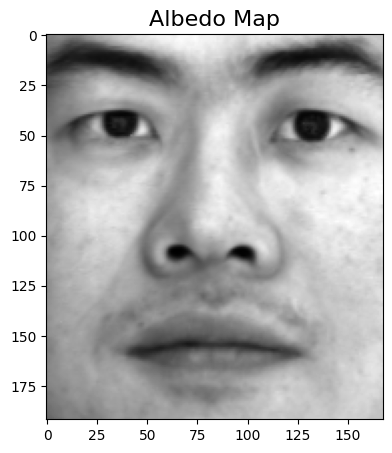

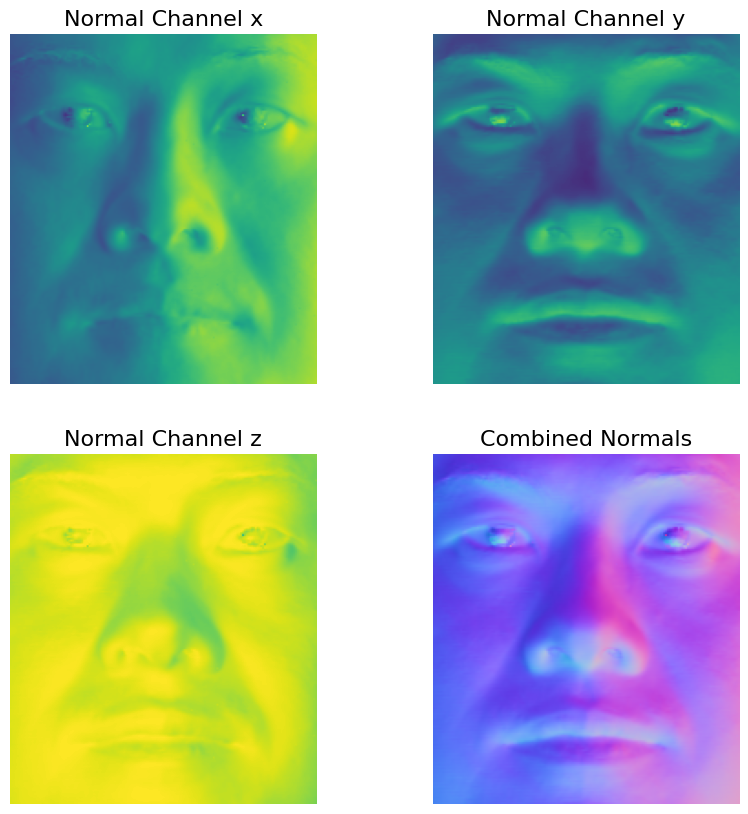

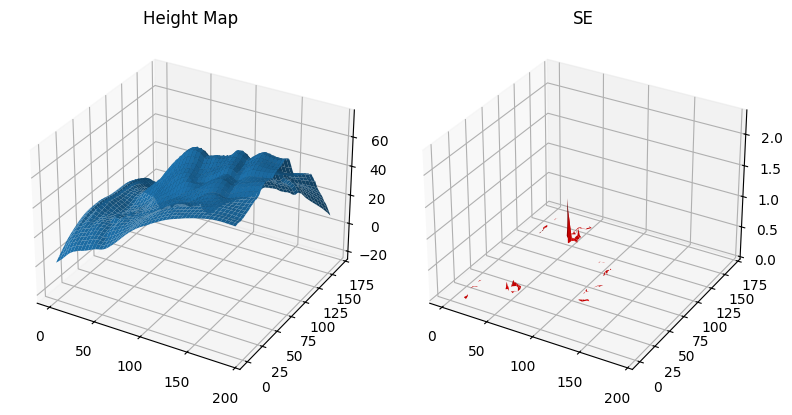

The Column major height map:
Loading images...

Finish loading 53 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 405

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


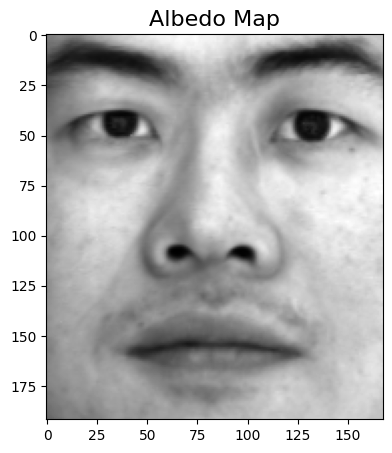

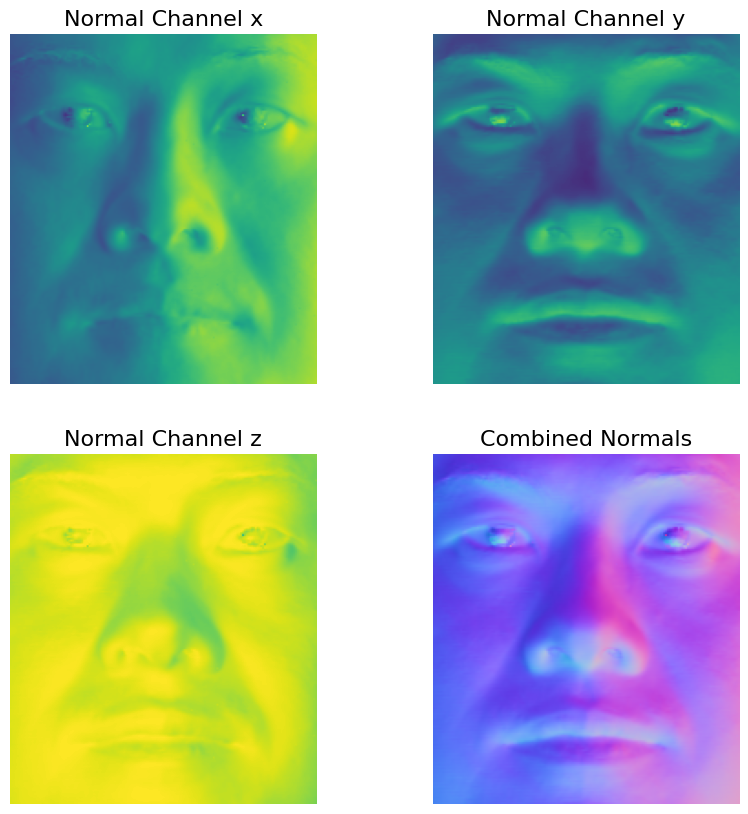

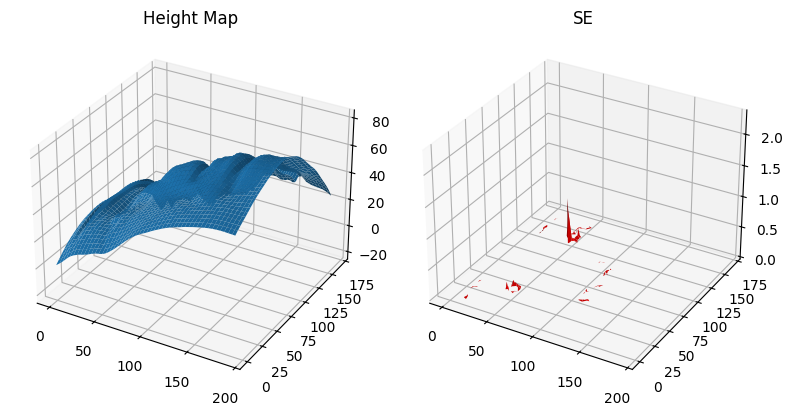

The Row major height map:
Loading images...

Finish loading 53 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 405

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


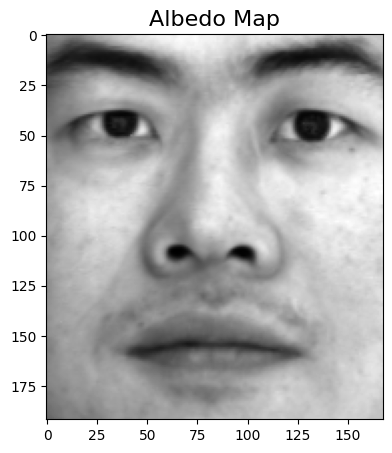

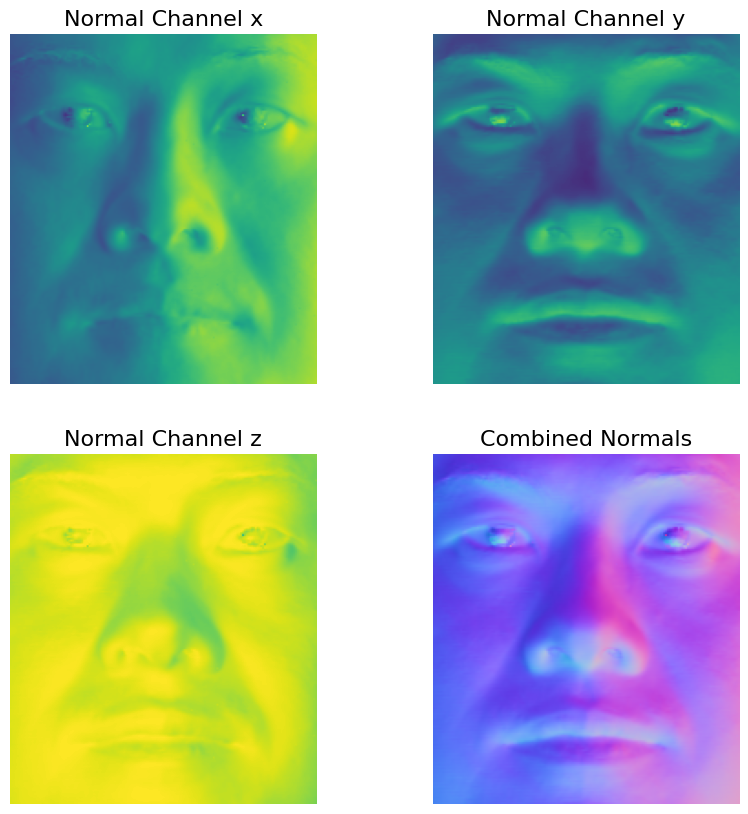

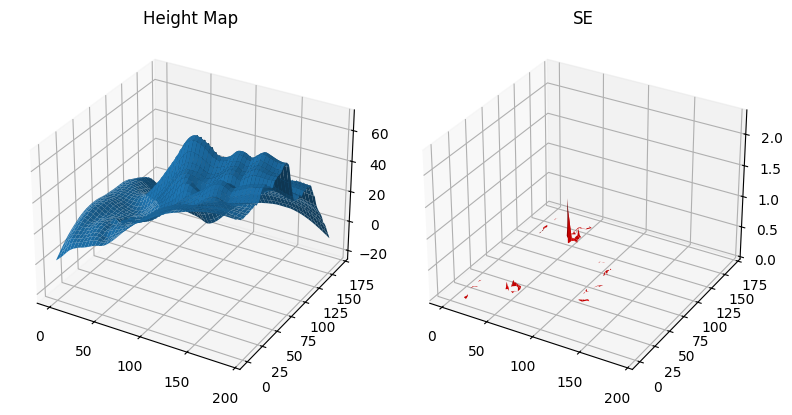

In [53]:
print('The Average height map:')
photometric_stereo_face_filtered(path_type='average', bad_images=question33_ex)

print('The Column major height map:')
photometric_stereo_face_filtered(path_type='column', bad_images=question33_ex)

print('The Row major height map:')
photometric_stereo_face_filtered(path_type='row', bad_images=question33_ex)

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

The core reason for improvement resides in the Lambertian Assumption. The photometric stereo technique is built considering this specific assumption: the imaged surface is Lambertian, meaning it reflects light uniformly in all directions. Problematic images, such as those with specular (shiny) reflections or deep cast shadows, violate this assumption. These regions provide misleading information to the algorithm, causing errors in the calculation of the surface orientation (the normals).

By removing these images, we are feeding the algorithm only valid data that conforms to its mathematical model. This leads to some noticeable improvements across all of the outputs:
- The albedo becomes much cleaner and more uniform. Dark artifacts from shadows and overly bright spots from specular highlights are eliminated. As a result, the true, intrinsic color of the face's skin is revealed more consistently.
- The normal map becomes smoother, more accurate, and more coherent. The noise and incorrect orientations caused by poor lighting are removed, allowing the algorithm to capture the fine details of the face—like the nose, lips, and cheeks—with much higher precision.
- Since the height map is derived by integrating the normal map, the improvement here is very clear. The final height map shows a far more realistic and believable 3D structure of the face. Contours and depths are modeled better, and the streaks and distortions that were present before filtering the images are much less evident.

At the end, by removing data that does not conform to the model's mathematical assumptions, we achieve a much more accurate and realistic 3D reconstruction of the face.

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [45]:
def load_apple_images(image_dir='./photometrics_images/Apple'):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    import glob
    import random

    number_images = 99
    
    file_name = os.path.join(image_dir, 'I_0000.png')
    sample_image = cv2.imread(file_name, -1)
    
    h, w = sample_image[:,:,0].shape
    
    pattern = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    pattern = random.sample(pattern, number_images)
    
    file_names = [os.path.basename(x) for x in pattern]
    file_names_idx = [int(i.split('_')[1].split('.')[0]) for i in file_names]

    image_stack = np.zeros([h, w, number_images])

    for i in range(number_images):
        image_stack[...,i] = cv2.imread(os.path.join(image_dir, file_names[i]), -1)[:,:,2]

    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        for idx in file_names_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)

    image_stack = np.double(image_stack)
    
    image_stack[image_stack < 0] = 0
    
    min_value = np.min(image_stack)
    max_value = np.max(image_stack)
    
    if max_value != min_value:
        image_stack = (image_stack - min_value) / (max_value - min_value)
    else:
        image_stack = np.zeros(image_stack.shape)  

    return image_stack, scriptV

In [46]:
def photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, path_type)
    
    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map, SE)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.

The Average height map:
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2709

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


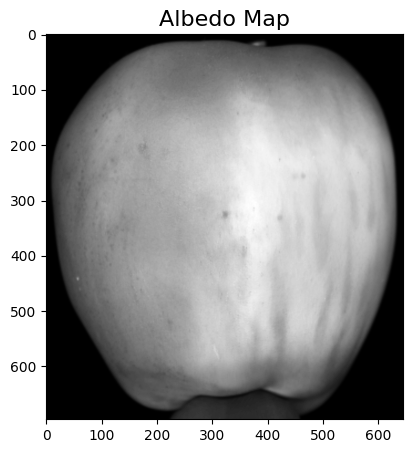

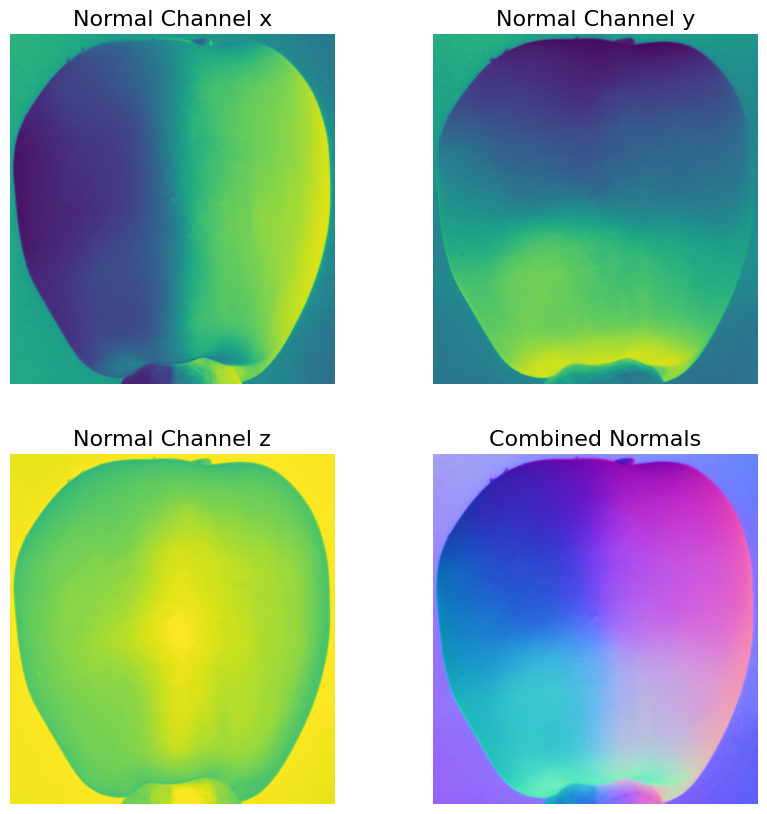

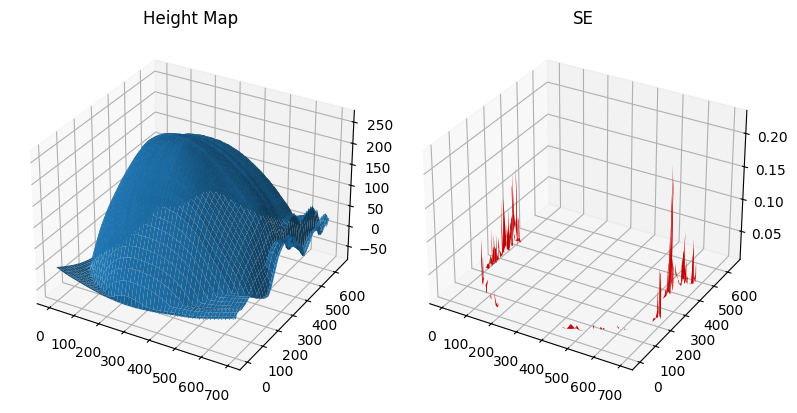

The Column major height map:
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2709

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


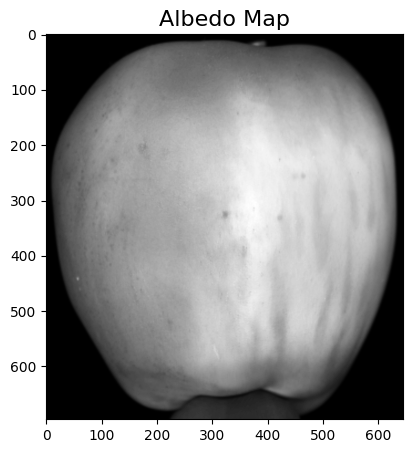

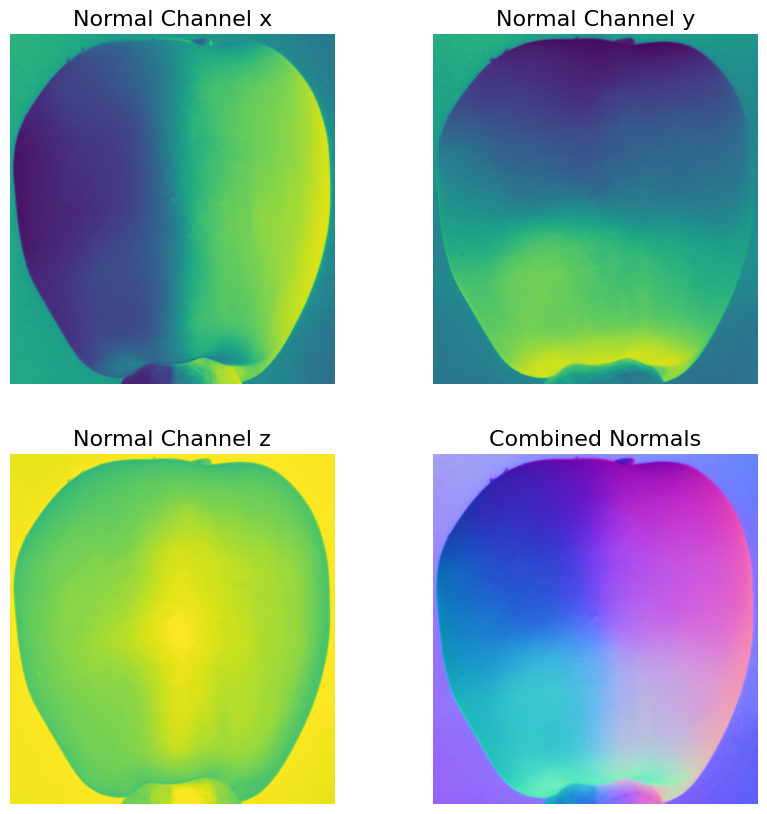

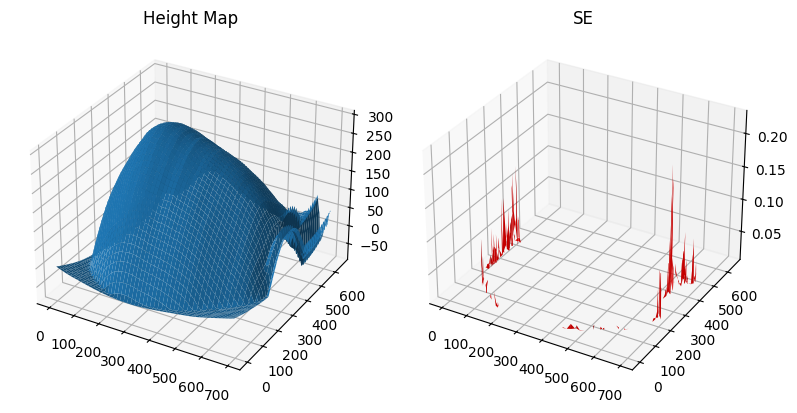

The Row major height map:
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 2709

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


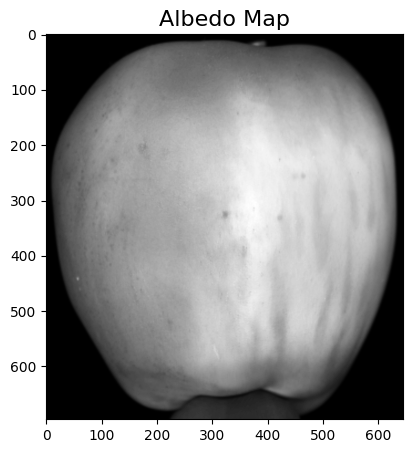

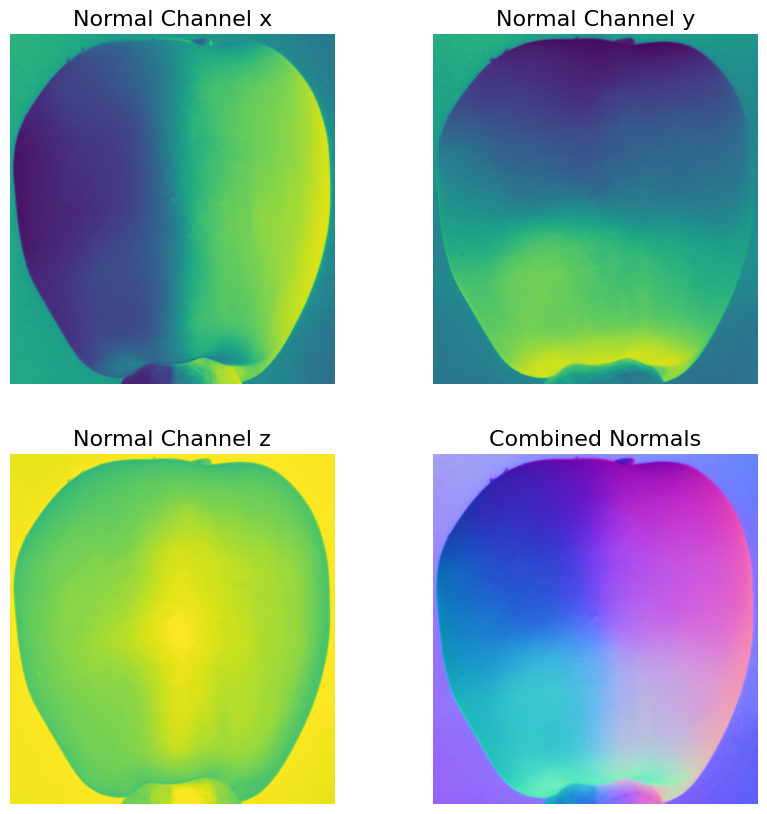

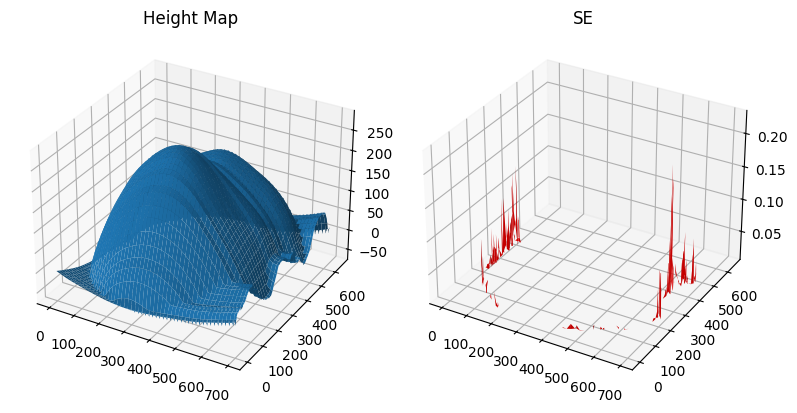

In [47]:
print('The Average height map:')
photometric_stereo_apple_dataset(path_type='average')

print('The Column major height map:')
photometric_stereo_apple_dataset(path_type='column')

print('The Row major height map:')
photometric_stereo_apple_dataset(path_type='row')

<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

In both integration paths, we notice regions that look unusual, corresponding to the shiny area of the apple. This happens because shiny reflections do not follow the Lambertian model, which introduces errors in the computation of surface normals.

When integrating along the horizontal direction, this shiny region appears bright, causing a sudden positive change in the derivative, followed by a sharp negative change once the region ends. As a result, a bump is formed in the height map. In the vertical integration, the effect is even more pronounced, since the reflections are mostly vertical. Only a few vertical lines are strongly affected by the shiny region, while their neighboring lines are not, creating a clear discontinuity in the height map. By contrast, the shiny part influences all horizontal lines, so we still see a bump but without such a sharp discontinuity.

The averaging method produces a smoother height map by combining both integration results and compensating for some of the errors. Nevertheless, the bump caused by the shiny reflection remains visible.

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| David Van Batenburg | 25% | 25% | 25% |
| Samuele Punzo | 25% | 25% | 25% |
| Edoardo Vergnano | 25% | 25% | 25% |
| Seyedeh Zahra Ahmadi | 25% | 25% | 25% |

### - End of Notebook -